# 06a Alternative analyses - FDG
Same as main 05a script but making FDG the independent variable instead of plasma.
This means that FDG-volume, FDG-cog, and FDG-FDG relationships are examined

In [36]:
# install required packages - commented out so it doesn't install every time
#%conda install -n Lauren openpyxl numpy pandas statsmodels plotnine matplotlib scikit-learn scipy mizani nbconvert pandoc pyreadstat kmodes seaborn

# import required packages
import numpy as np;
import pandas as pd;
from sklearn import preprocessing 
import statsmodels as sm;
import statsmodels.formula.api as smf;
import plotnine as p9;
import itertools
import pickle

import scipy; # for spearmann correlation



# read in and clean data

In [37]:
data_folder_loc = '//admsyn/Primary/ADM/CustomerStudies/Rockefeller/Riluzole_Biomarkers/'
code_folder_loc = '//admsyn/homes/@DH-ADMDX/0/lauren.koenig-1606/code/Riluzole FDG/'

In [38]:
# read in data
composite_rr, pons_rr, para_rr, new_para_rr, ras_rr = pd.read_pickle(code_folder_loc + '/output/01_newdata.pkl')

In [39]:
all_data = new_para_rr #[~new_para_rr['ID_ADM'].isin(['APE-792_23', 'APE-792_35', 'APE-792_39', 'APE-792_65', 'APE-792_71', 'RIL_17', 'RIL_21', 'RIL_24', 'APE-792_9','APE-792_22', 'RIL_13'])].copy()#
data_name = 'new_para_rr'

In [40]:
# orig has additional 
# 
# pons (1st) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'FRONTAL-gm', 'Avg_MedOrbFrontal', 'Avg PCC'
# para (1st) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'FRONTAL-gm', 'Avg_MedOrbFrontal'

# para (new) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'Avg PCC', 'Avg_MedOrbFrontal'
# para (new) also has 'SensMot-gm', 'Paracentral-gm', 'RASref1-gm'

# ras (new) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'Avg_MedOrbFrontal'
# ras (new) also has 'SensMot-gm', 'Paracentral-gm', 'RASref1-gm', 'CO', 'Graycer-gm', 'Vermis-gm'

In [41]:
# define biomarker groups
FDG_columns = ['Avg_MedOrbFrontal', 'Graycer_gm', 'Avg_PCC', 'Avg_Hip', 'MTL_gm', 'CO', 'Temp', 'SensMot_gm', 'L_Hip',
 'Vermis_gm', 'FRONTAL_gm', 'AC_gm', 'Precun_gm', 'Par_gm', 'Temp_gm', 'R_Hip', 'PostCing_gm'] # , 'RASref1_gm', 'Paracentral_gm'

FDG_columns = [ele for ele in FDG_columns if ele in all_data.columns]
print(FDG_columns)

plasma_columns = [ 'Ab42_40', 'GFAP', 'NFL',  'pTau181', 'pTau217',  'pTau231', 'GFAP_aa', 'NFL_aa', 'pTau217_Ab42'] # 'Ab40', 'Ab42', , 'pTau181_Ab42'
log10_plasma_columns = [s + '_log10' for s in plasma_columns]

cog_columns = ['MMSE', 'adascogtotal', 'bvrt', 'dstotal','tma','tmb',  'cowattotal', 'cdrtotal', 'cdrsum', 'adltotal', 'npitotal', 'gds']
vol_columns = ['VOL_Ventricles_Lz',
       'VOL_Ventricles_Rz', 'VOL_Putamen_Lz', 'VOL_Putamen_Rz',
       'VOL_ParaHip_Lz', 'VOL_ParaHip_Rz', 'VOL_Fusi_Lz', 'VOL_Fusi_Rz',
       'VOL_InfTemp_Lz', 'VOL_InfTemp_Rz', 'VOL_MidTemp_Lz', 'VOL_MidTemp_Rz',
       'VOL_SupTemp_Lz', 'VOL_SupTemp_Rz', 'VOL_Precun_Lz', 'VOL_Precun_Rz',
       'VOL_InfPar_Lz', 'VOL_InfPar_Rz', 'VOL_ParaPostCentr_Lz',
       'VOL_ParaPostCentr_Rz', 'VOL_SupraMarg_Lz', 'VOL_SupraMarg_Rz',
       'VOL_SupPar_Lz', 'VOL_SupPar_Rz', 'VOL_OrbitFront_Lz',
       'VOL_OrbitFront_Rz', 'VOL_Insula_Lz', 'VOL_Insula_Rz',
       'VOL_InfFront_Lz', 'VOL_InfFront_Rz', 'VOL_MidFront_Lz',
       'VOL_MidFront_Rz', 'VOL_SupFront_Lz', 'VOL_SupFront_Rz',
       'VOL_PrecFront_Lz', 'VOL_PrecFront_Rz', 'VOL_LatOcc_Lz',
       'VOL_LatOcc_Rz', 'VOL_Lingual_Lz', 'VOL_Lingual_Rz', 'VOL_Cuneus_Lz',
       'VOL_Cuneus_Rz', 'VOL_Pericalc_Lz', 'VOL_Pericalc_Rz',
       'VOL_AntCingulate_Lz', 'VOL_AntCingulate_Rz', 'VOL_PostCingulate_Lz',
       'VOL_PostCingulate_Rz', 'VOL_Entorhinal_Lz', 'VOL_Entorhinal_Rz',
       'VOL_Hip_Lz', 'VOL_Hip_Rz', 'VOL_TotalGrayz', 'VOL_TotalGray_Lz',
       'VOL_TotalGray_Rz', 'VOL_LatTemp_Lz', 'VOL_LatTemp_Rz',
       'VOL_Parietal_Lz', 'VOL_Parietal_Rz', 'VOL_Frontal_Lz',
       'VOL_Frontal_Rz', 'VOL_InfMidTemp_Lz', 'VOL_InfMidTemp_Rz',
       'VOL_InfInsFrontal_Lz', 'VOL_InfInsFrontal_Rz', 'VOL_MidSupFrontal_Lz',
       'VOL_MidSupFrontal_Rz', 'VOL_Inf_Mid_Fus_Temp_Lz',
       'VOL_Inf_Mid_Fus_Temp_Rz', 'VOL_Precun_InfPar_Lz',
       'VOL_Precun_InfPar_Rz', 'VOL_Precun_InfPar_Supramarg_Lz',
       'VOL_Precun_InfPar_Supramarg_Rz', 'VOL_LatOccLingCun_Lz',
       'VOL_LatOccLingCun_Rz', 'VOL_InfParSupra_Lz', 'VOL_InfParSupra_Rz']

['MTL_gm', 'SensMot_gm', 'FRONTAL_gm', 'AC_gm', 'Precun_gm', 'Par_gm', 'Temp_gm', 'PostCing_gm']


In [42]:
print('any missing covariate data?')
all_data[all_data['timepoint'].isin(['base'])].dropna(subset = FDG_columns, how = 'all')[['age', 'Education_years', 'sex', 'apoe4_carrier', 'race']].isna().value_counts().sort_index()

any missing covariate data?


age    Education_years  sex    apoe4_carrier  race 
False  False            False  False          False    40
                               True           False     1
                                              True      6
True   True             True   True           True      1
Name: count, dtype: int64

## make data subsets

In [43]:
# make data subsets
# baseline and non-trial data
baseline_data = all_data[all_data['timepoint'].isin(['base', 'not part of trial'])]

# baseline only
baseline_trial_data = all_data[all_data['timepoint'].isin(['base'])]

# baseline only and only age 70-80
baseline_trial_data_70_80 = baseline_trial_data[(baseline_trial_data['age']<=80) & (baseline_trial_data['age']>=70)]

# Analyses

In [44]:
covariate_p_threshold = 0.05

## version using log10 plasma data

In [45]:
biomarker_relationship_results_log10 = pd.DataFrame()


for varlist in [ FDG_columns, log10_plasma_columns, cog_columns, vol_columns]:
    combinations = pd.DataFrame(list(itertools.product(FDG_columns, varlist)))

    for idx in range(combinations[0].size):
        x_var = combinations[0][idx]
        y_var = combinations[1][idx]
        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [y_var, x_var])

        # z-score data
        temp_df_baseline[[y_var, x_var, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[y_var, x_var, 'Education_years', 'age']])

        # run 1 - check for significant covariates
        sig_pvals_start = ['age', 'Education_years', 'apoe4_carrier', 'sex', 'race', x_var]
        change = 1
        full_model = smf.ols(formula = y_var + ' ~ ' + ' + '.join(sig_pvals_start), data = temp_df_baseline).fit()
        temp_df_baseline['full_model_residuals'] = full_model.resid

        while change > 0:
            model_vars = ' + '.join(sig_pvals_start)        
            test_model = smf.ols(formula = y_var + ' ~ ' + model_vars, data = temp_df_baseline).fit()
            sig_pvals = test_model.pvalues[test_model.pvalues < covariate_p_threshold].index.to_list()
            sig_pvals = [ele.split('[')[0] for ele in sig_pvals] # drop the [] indicators
            sig_pvals_unique = []
            for item in sig_pvals:
                if (item not in sig_pvals_unique) & (item not in ['Intercept']): sig_pvals_unique.append(item)
            if (x_var not in sig_pvals_unique):
                sig_pvals_unique = sig_pvals_unique + [x_var]
            change = len(sig_pvals_start) - len(sig_pvals_unique)
            sig_pvals_start = sig_pvals_unique
        
        # run 2 -with just the significant covariates (but forcing the x_var to be included)
        model_vars = ' + '.join(sig_pvals_unique)        
        model = smf.ols(formula = y_var + ' ~ ' + model_vars , data = temp_df_baseline).fit()

        model_p_val_baseline = model.pvalues
        model_B_val_baseline = model.params
        model_n_baseline = len(temp_df_baseline.dropna(subset = sig_pvals_unique + [y_var]))


        # save results
        temp_results  =  pd.DataFrame([y_var, x_var, model_p_val_baseline, model_B_val_baseline, model_n_baseline]).T

        temp_results.columns = ['y_var', 'x_var', 
        'model_p_val_baseline', 'model_B_val_baseline', 'model_n_baseline']
        
        # separate out p and B values into separate columns
        df_mv_age_pvals = pd.DataFrame(temp_results['model_p_val_baseline'][0]).T
        df_mv_age_pvals.columns = 'model_p_val_' + df_mv_age_pvals.columns
        temp_results[df_mv_age_pvals.columns] = df_mv_age_pvals

        df_mv_age_bvals = pd.DataFrame(temp_results['model_B_val_baseline'][0]).T
        df_mv_age_bvals.columns = 'model_B_val_' + df_mv_age_bvals.columns
        temp_results[df_mv_age_bvals.columns] = df_mv_age_bvals                
        
        # remove self-correlations
        temp_results = temp_results[~(temp_results['y_var'] == temp_results['x_var'])]

        # rename so var2 is in the same column
        temp_results = temp_results.rename(columns = dict(zip(temp_results.columns, [ele.replace(x_var, 'x_var') for ele in temp_results.columns ])))

        # add to full list of results
        biomarker_relationship_results_log10 = pd.concat([biomarker_relationship_results_log10, temp_results])


In [46]:
selected_p_column = ['model_p_val_x_var']

In [47]:
# set multiple comparisons correction type
mc = 'fdr_bh' #options are bonferroni, sidak, holm-sidak, holm, simes-hochberg, hommel, fdr_bh, fdr_by, fdr_tsbh, fdr_tsbky

# apply multiple comparisons correction separately for each plasma biomarker
#for var in biomarker_relationship_results_log10['y_var'].drop_duplicates().to_list():
#    biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]), selected_p_column] = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]), selected_p_column].apply(lambda x: sm.stats.multitest.multipletests(x.replace({np.nan:1}), method=mc)[1])

In [48]:
biomarker_relationship_results_log10['type'] = 'other'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin( FDG_columns), 'type'] = 'FDG PET'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin(log10_plasma_columns + log10_plasma_columns), 'type'] = 'Plasma'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin(cog_columns), 'type'] = 'Cognitive'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin(vol_columns), 'type'] = 'Volumetric'

In [49]:
biomarker_relationship_results_log10['type'].value_counts()

type
Volumetric    616
Cognitive      96
Plasma         72
FDG PET        56
Name: count, dtype: int64

# save results

In [50]:
temp_df = biomarker_relationship_results_log10.drop(columns = ['model_B_val_baseline', 'model_p_val_baseline']).copy()

temp_df = biomarker_relationship_results_log10.drop(columns = ['model_B_val_baseline', 'model_p_val_baseline']).copy()
p_cols = temp_df.columns[temp_df.columns.str.contains('_p_val_')].sort_values()
B_cols = temp_df.columns[temp_df.columns.str.contains('_B_val_')].sort_values()
other_cols = [ele for ele in temp_df.columns.sort_values() if (ele not in p_cols)  & (ele not in B_cols)]

temp_df = temp_df[[
'type', 'y_var', 'x_var','model_n_baseline', 
'model_B_val_x_var', 'model_p_val_x_var',
'model_B_val_age',  'model_p_val_age',
'model_B_val_Education_years', 'model_p_val_Education_years', 
'model_B_val_apoe4_carrier[T.Yes]','model_p_val_apoe4_carrier[T.Yes]', 
'model_B_val_race[T.White/NH]',  'model_p_val_race[T.White/NH]', 
'model_B_val_sex[T.M]','model_p_val_sex[T.M]', 
'model_B_val_Intercept','model_p_val_Intercept'
]]

temp_df[B_cols] = temp_df[B_cols].round(2)
temp_df[p_cols] = temp_df[p_cols].round(5)

temp_df[p_cols] = temp_df[p_cols].replace({0.0:'<0.00001'})



temp_df[B_cols]

,model_B_val_Education_years,model_B_val_Intercept,model_B_val_age,model_B_val_apoe4_carrier[T.Yes],model_B_val_race[T.White/NH],model_B_val_sex[T.M],model_B_val_x_var
0,NaN,-0.00,0.29,NaN,NaN,NaN,0.52
0,NaN,0.24,0.32,NaN,NaN,-0.62,0.76
0,NaN,-0.00,NaN,NaN,NaN,NaN,0.51
0,NaN,-0.00,0.41,NaN,NaN,NaN,0.41
0,NaN,-0.00,0.46,NaN,NaN,NaN,0.34
...,...,...,...,...,...,...,...
0,NaN,-0.00,0.48,NaN,NaN,NaN,0.07
0,NaN,-0.00,NaN,NaN,NaN,NaN,0.05
0,NaN,0.00,NaN,NaN,NaN,NaN,0.13
0,NaN,0.00,0.54,NaN,NaN,NaN,0.02


In [51]:
temp_df = biomarker_relationship_results_log10.drop(columns = ['model_B_val_baseline', 'model_p_val_baseline']).copy()

temp_df = biomarker_relationship_results_log10.drop(columns = ['model_B_val_baseline', 'model_p_val_baseline']).copy()
p_cols = temp_df.columns[temp_df.columns.str.contains('_p_val_')].sort_values()
B_cols = temp_df.columns[temp_df.columns.str.contains('_B_val_')].sort_values()
other_cols = [ele for ele in temp_df.columns.sort_values() if (ele not in p_cols)  & (ele not in B_cols)]

temp_df = temp_df[[
'type', 'y_var', 'x_var','model_n_baseline', 
'model_B_val_x_var', 'model_p_val_x_var',
'model_B_val_age',  'model_p_val_age',
'model_B_val_Education_years', 'model_p_val_Education_years', 
'model_B_val_apoe4_carrier[T.Yes]','model_p_val_apoe4_carrier[T.Yes]', 
'model_B_val_race[T.White/NH]',  'model_p_val_race[T.White/NH]', 
'model_B_val_sex[T.M]','model_p_val_sex[T.M]', 
'model_B_val_Intercept','model_p_val_Intercept'
]]

temp_df[B_cols] = temp_df[B_cols].round(2)
temp_df[p_cols] = temp_df[p_cols].round(5)

temp_df[p_cols] = temp_df[p_cols].replace({0.0:'<0.00001'})

temp_df = temp_df.rename(columns = {
'model_n_baseline':'number of subjects'})

temp_df = temp_df.rename(columns = dict(zip(temp_df.columns, [ele.replace('model_', '') for ele in temp_df.columns])))

temp_df.columns = temp_df.columns.str.replace('B_val', 'beta_val')


In [52]:
'''full_names = pd.read_csv(code_folder_loc + 'data/data-dictionary.csv')
full_names = dict(zip(full_names['variable_name'], full_names['full_name']))
temp_df['x_var'] = temp_df['x_var'].replace(full_names)
temp_df['y_var'] = temp_df['y_var'].replace(full_names)'''

"full_names = pd.read_csv(code_folder_loc + 'data/data-dictionary.csv')\nfull_names = dict(zip(full_names['variable_name'], full_names['full_name']))\ntemp_df['x_var'] = temp_df['x_var'].replace(full_names)\ntemp_df['y_var'] = temp_df['y_var'].replace(full_names)"

In [53]:
temp_df = temp_df.sort_values(['x_var', 'type', 'y_var'])
temp_df

,type,y_var,x_var,number of subjects,beta_val_x_var,p_val_x_var,beta_val_age,p_val_age,beta_val_Education_years,p_val_Education_years,beta_val_apoe4_carrier[T.Yes],p_val_apoe4_carrier[T.Yes],beta_val_race[T.White/NH],p_val_race[T.White/NH],beta_val_sex[T.M],p_val_sex[T.M],beta_val_Intercept,p_val_Intercept
0,Cognitive,MMSE,AC_gm,41,0.01,0.97321,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0
0,Cognitive,adascogtotal,AC_gm,41,-0.04,0.82706,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0
0,Cognitive,adltotal,AC_gm,41,0.01,0.95225,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
0,Cognitive,bvrt,AC_gm,40,-0.21,0.19234,NaN,NaN,0.39,0.02066,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0
0,Cognitive,cdrsum,AC_gm,41,-0.08,0.59757,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,Volumetric,VOL_TotalGray_Lz,Temp_gm,42,0.23,0.09408,0.45,0.00228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
0,Volumetric,VOL_TotalGray_Rz,Temp_gm,42,0.39,0.00494,0.39,0.00565,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
0,Volumetric,VOL_TotalGrayz,Temp_gm,42,0.33,0.01683,0.45,0.00146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
0,Volumetric,VOL_Ventricles_Lz,Temp_gm,42,-0.11,0.50434,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0


In [54]:
with pd.ExcelWriter(code_folder_loc + 'output/06a_FDG_model_results_' + data_name + '.xlsx') as writer:
   
    # use to_excel function and specify the sheet_name and index 
    # to store the dataframe in specified sheet
    temp_df[temp_df['x_var'].isin(['Avg_PCC'])].to_excel(writer, sheet_name='Avg_PCC', index=False)
    temp_df[temp_df['x_var'].isin(['MTL_gm'])].to_excel(writer, sheet_name='MTL_gm', index=False)
    temp_df[temp_df['x_var'].isin(['AC_gm'])].to_excel(writer, sheet_name='AC_gm', index=False)
    temp_df[temp_df['x_var'].isin(['Precun_gm'])].to_excel(writer, sheet_name='Precun_gm', index=False)
    temp_df[temp_df['x_var'].isin(['Par_gm'])].to_excel(writer, sheet_name='Par_gm', index=False)
    temp_df[temp_df['x_var'].isin(['Temp_gm'])].to_excel(writer, sheet_name='Temp_gm', index=False)
    temp_df[temp_df['x_var'].isin(['PostCing_gm'])].to_excel(writer, sheet_name='PostCing_gm', index=False)
    temp_df.loc[(temp_df['p_val_x_var'].replace({'<0.00001':0.0})<0.05), :].sort_values('x_var').to_excel(writer, sheet_name='Significant', index=False)



temp_df

C:\Users\Lauren.Koenig\AppData\Local\Temp\4\ipykernel_39132\3757855560.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`


,type,y_var,x_var,number of subjects,beta_val_x_var,p_val_x_var,beta_val_age,p_val_age,beta_val_Education_years,p_val_Education_years,beta_val_apoe4_carrier[T.Yes],p_val_apoe4_carrier[T.Yes],beta_val_race[T.White/NH],p_val_race[T.White/NH],beta_val_sex[T.M],p_val_sex[T.M],beta_val_Intercept,p_val_Intercept
0,Cognitive,MMSE,AC_gm,41,0.01,0.97321,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0
0,Cognitive,adascogtotal,AC_gm,41,-0.04,0.82706,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0
0,Cognitive,adltotal,AC_gm,41,0.01,0.95225,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
0,Cognitive,bvrt,AC_gm,40,-0.21,0.19234,NaN,NaN,0.39,0.02066,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0
0,Cognitive,cdrsum,AC_gm,41,-0.08,0.59757,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,Volumetric,VOL_TotalGray_Lz,Temp_gm,42,0.23,0.09408,0.45,0.00228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
0,Volumetric,VOL_TotalGray_Rz,Temp_gm,42,0.39,0.00494,0.39,0.00565,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
0,Volumetric,VOL_TotalGrayz,Temp_gm,42,0.33,0.01683,0.45,0.00146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0
0,Volumetric,VOL_Ventricles_Lz,Temp_gm,42,-0.11,0.50434,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.0,1.0


In [55]:
# change log10 plasma names so that graphs will graph raw values (after saved results so that its obvious which models the pvalues belong to)
biomarker_relationship_results_log10 = biomarker_relationship_results_log10.replace('_log10', '', regex = True)

C:\Users\Lauren.Koenig\AppData\Local\Temp\4\ipykernel_39132\3529938600.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`


## Save pickle

# Plot Results
the notes listed and graphs plotted are for relationships with significant model_p_val_x_var

In [56]:
graphing_pval = 0.05
pvals_to_consider = ['model_p_val_x_var']
Bval_to_grab = 'model_B_val_x_var'

biomarker_relationship_results_log10.loc[(biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 'x_var'].value_counts()

x_var
Par_gm         49
Temp_gm        38
Precun_gm      37
FRONTAL_gm     25
AC_gm          23
PostCing_gm    17
MTL_gm         16
SensMot_gm     12
Name: count, dtype: int64

## Avg_PCC

In [57]:
x_var = 'Avg_PCC'

In [58]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True).round(3).replace({0.0:'<0.001'}).astype('str')[0]
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval: ' + p_value + ', beta = ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## MTL_gm

In [59]:
x_var = 'MTL_gm'

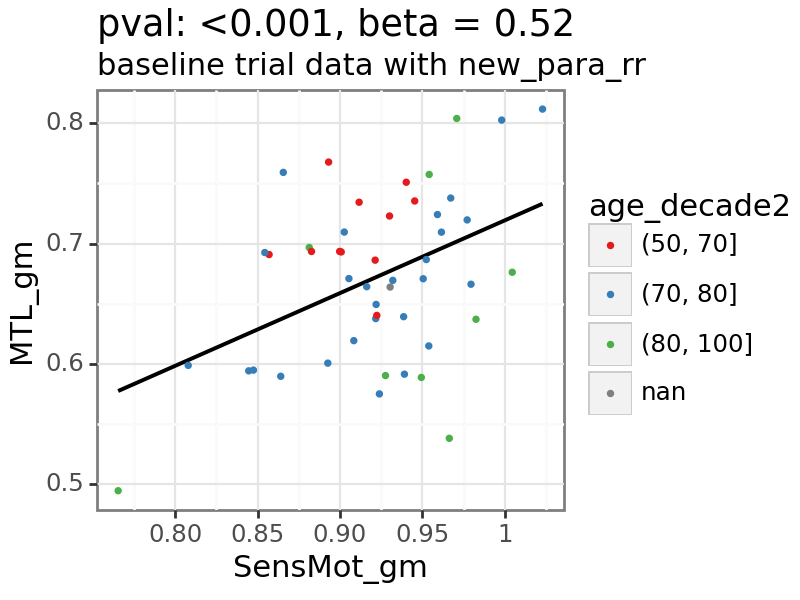

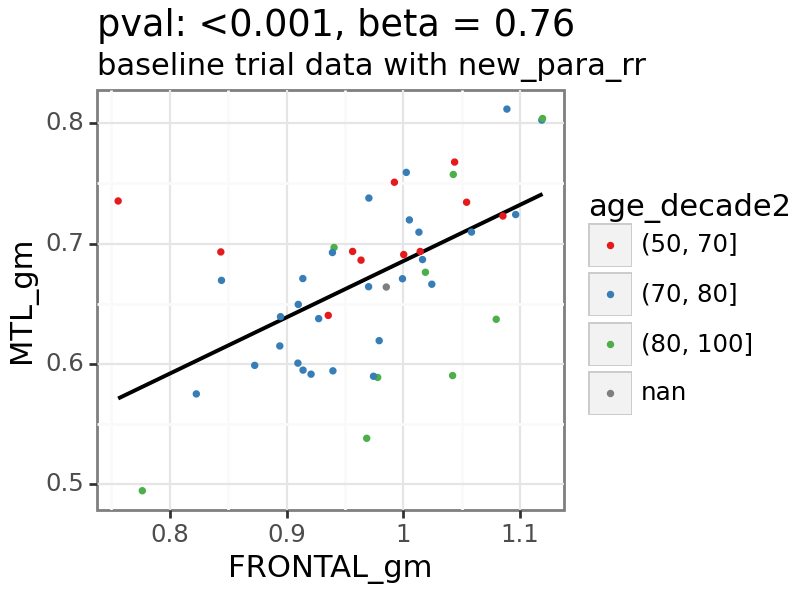

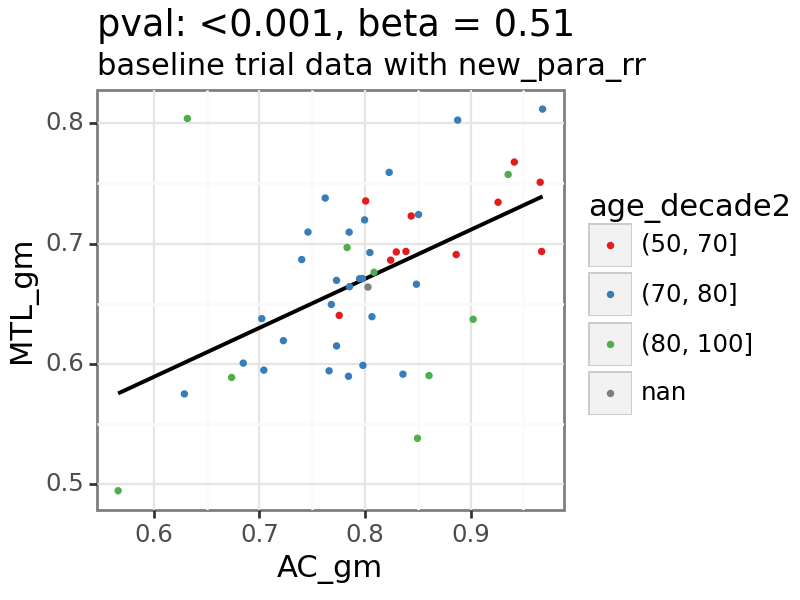

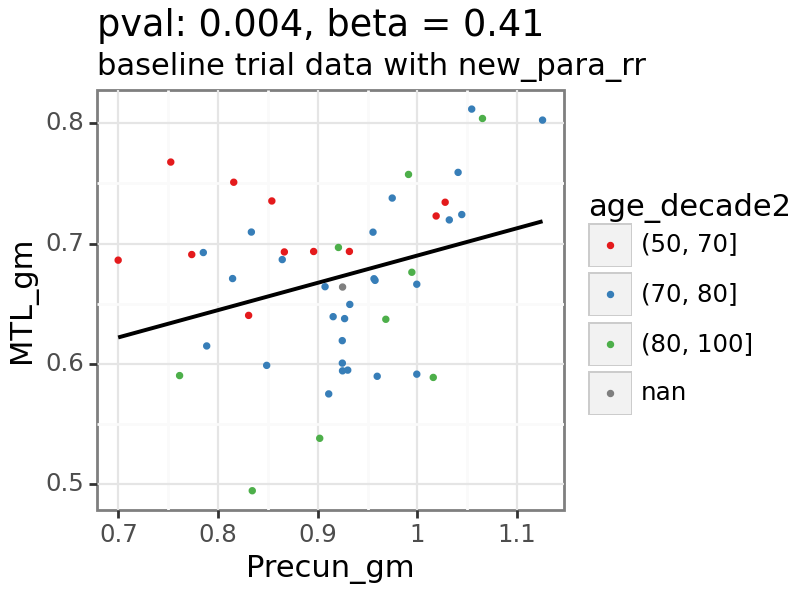

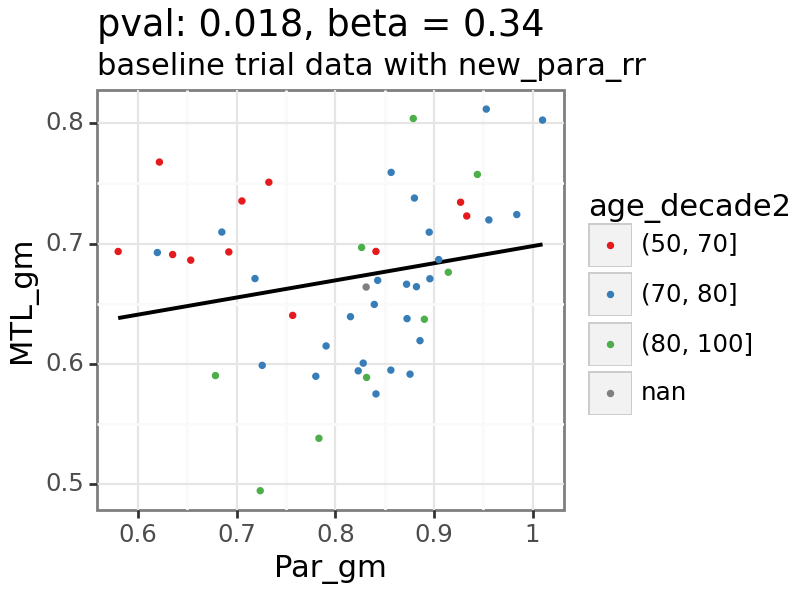

...

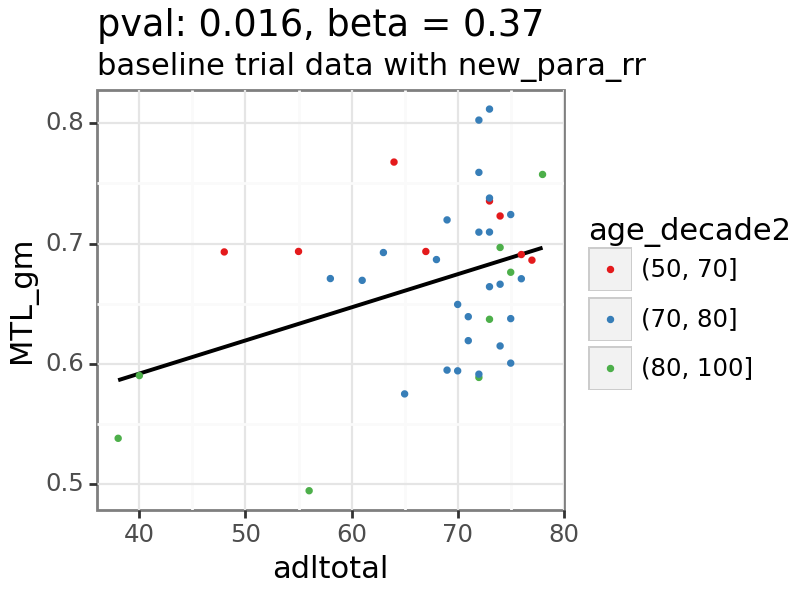

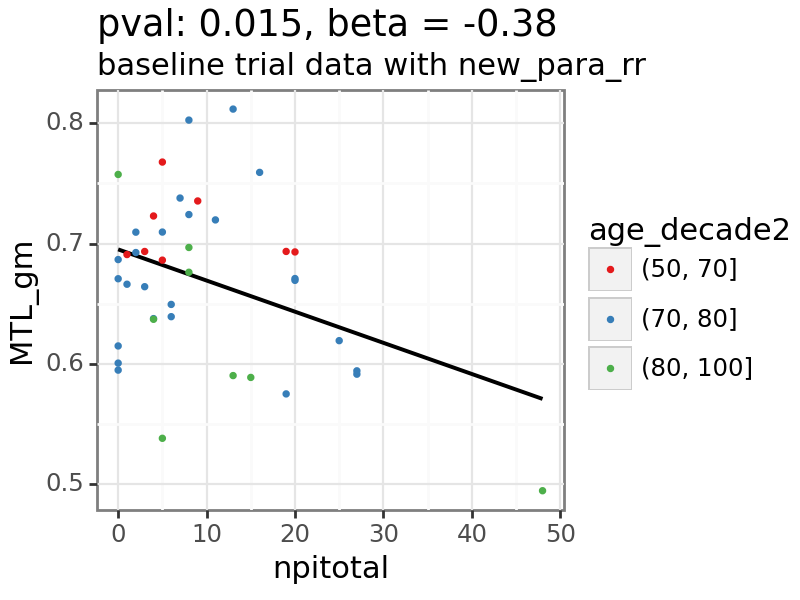

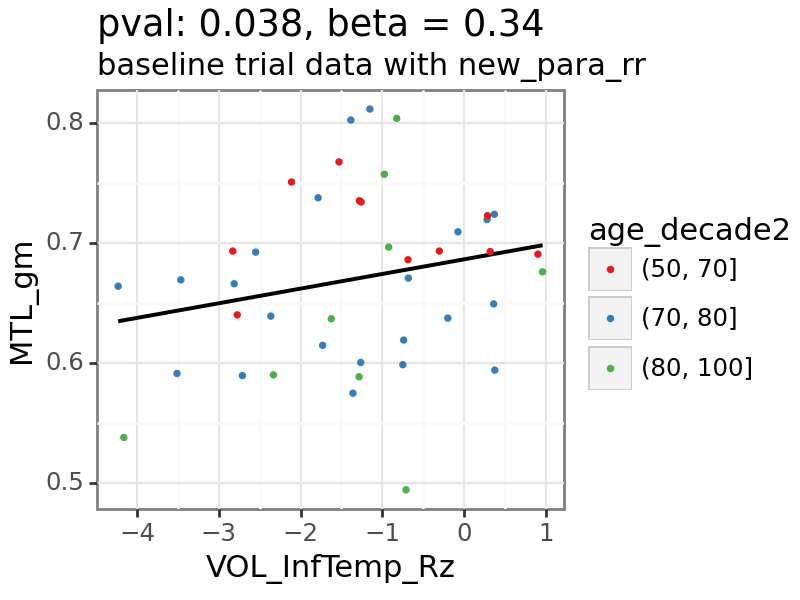

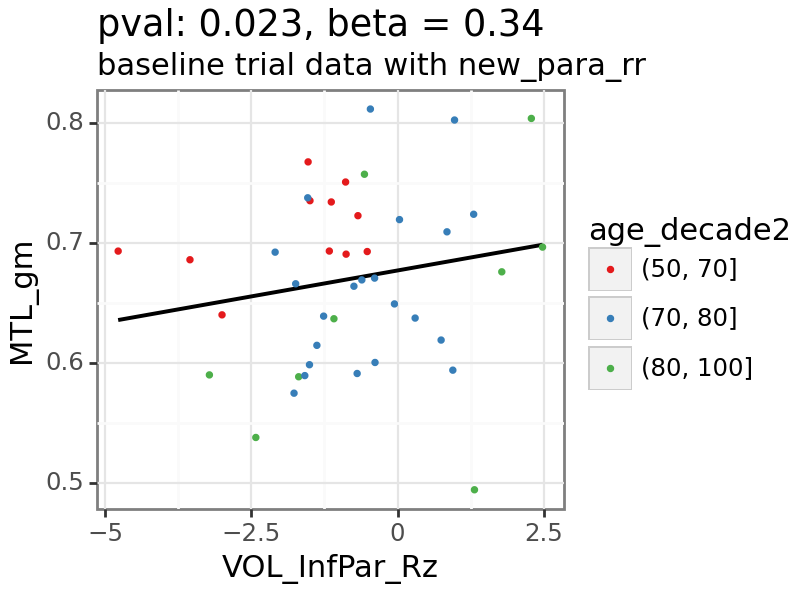

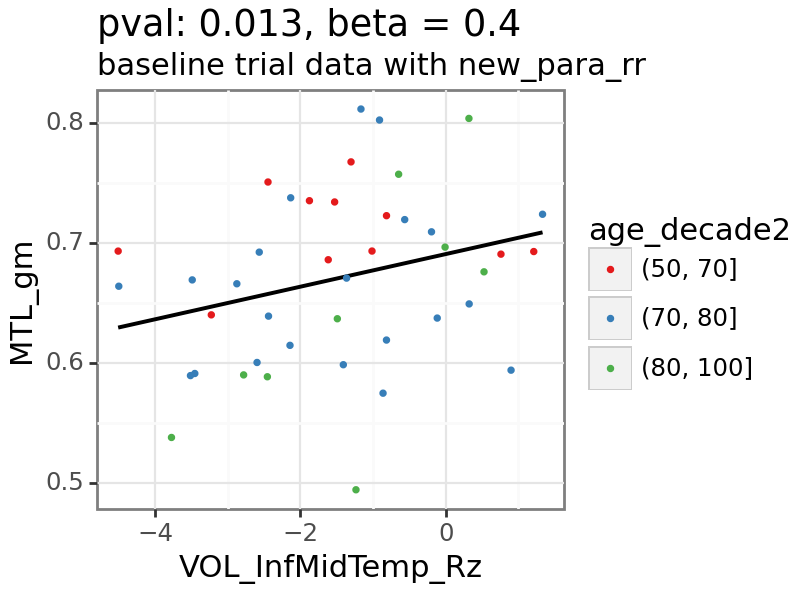

In [60]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True).round(3).replace({0.0:'<0.001'}).astype('str')[0]
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval: ' + p_value + ', beta = ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## AC_gm

In [61]:
x_var = 'AC_gm'

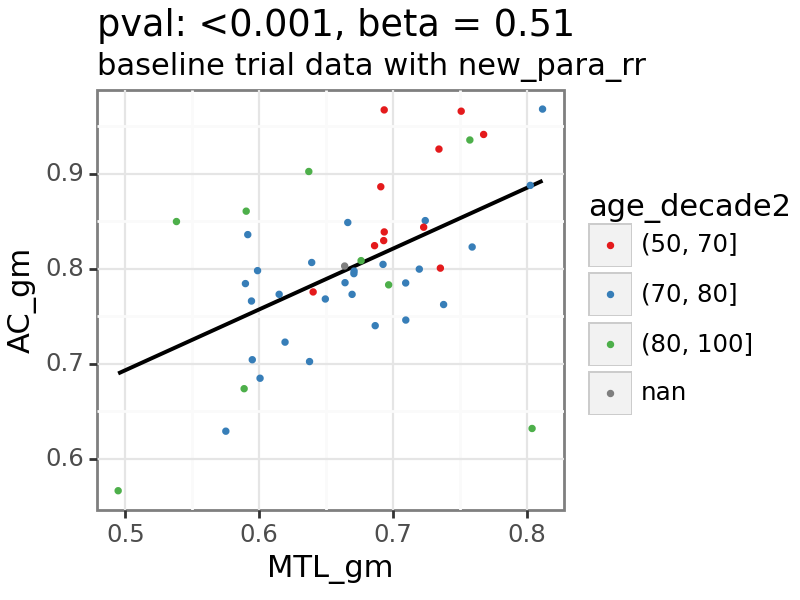

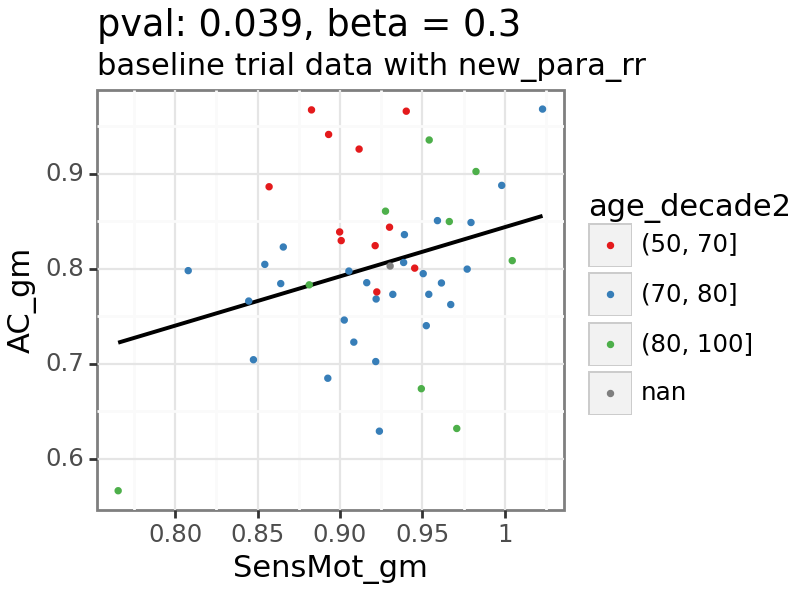

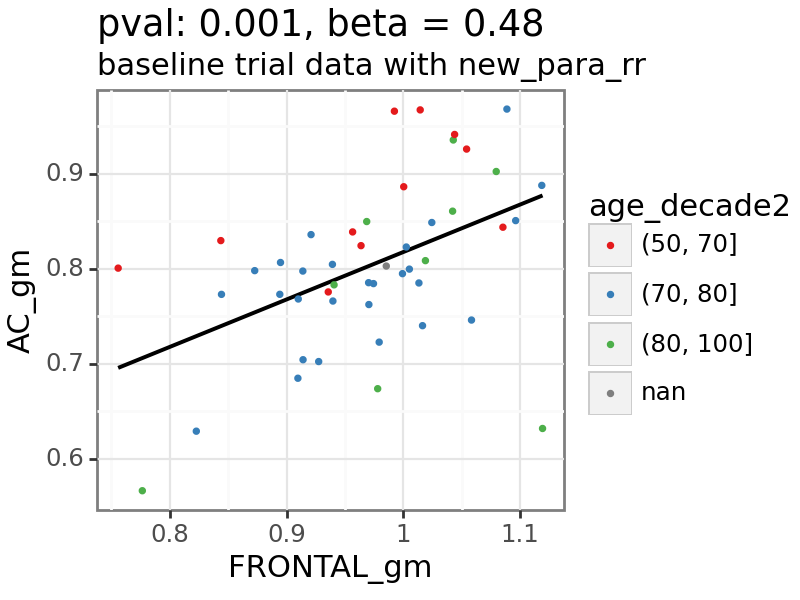

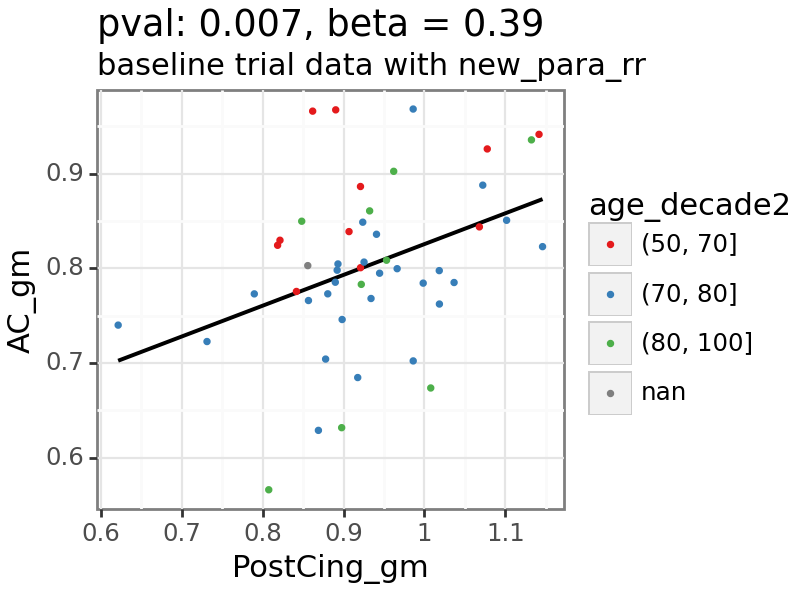

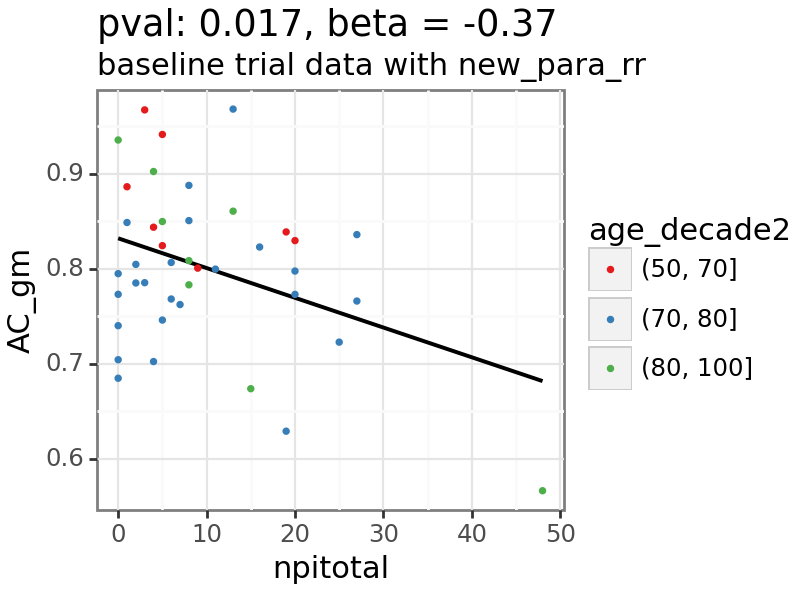

...

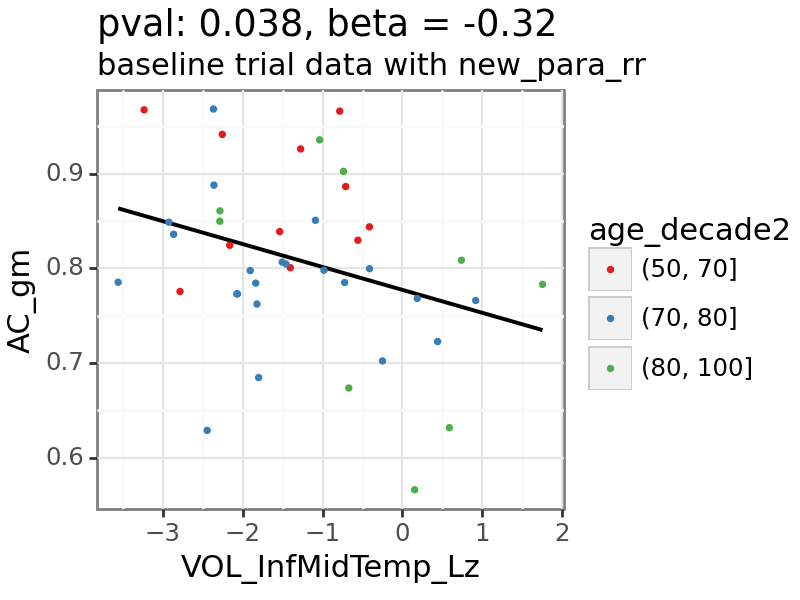

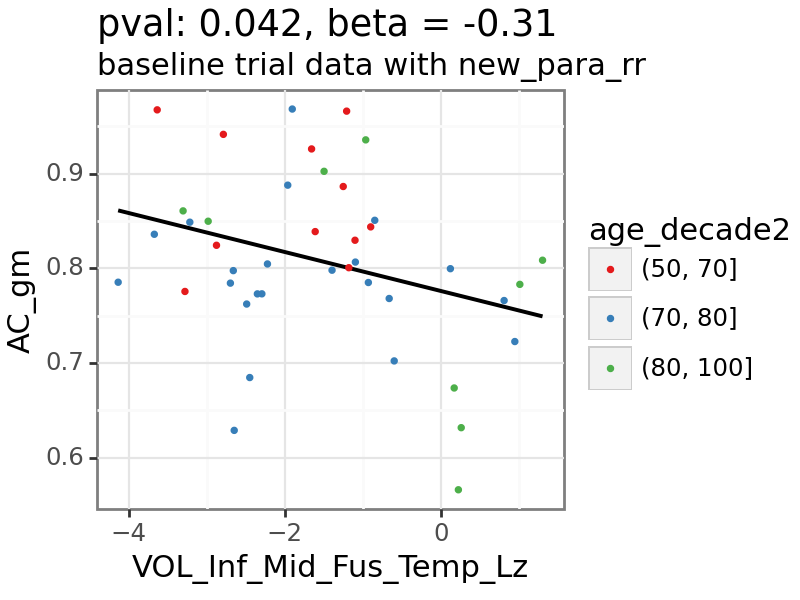

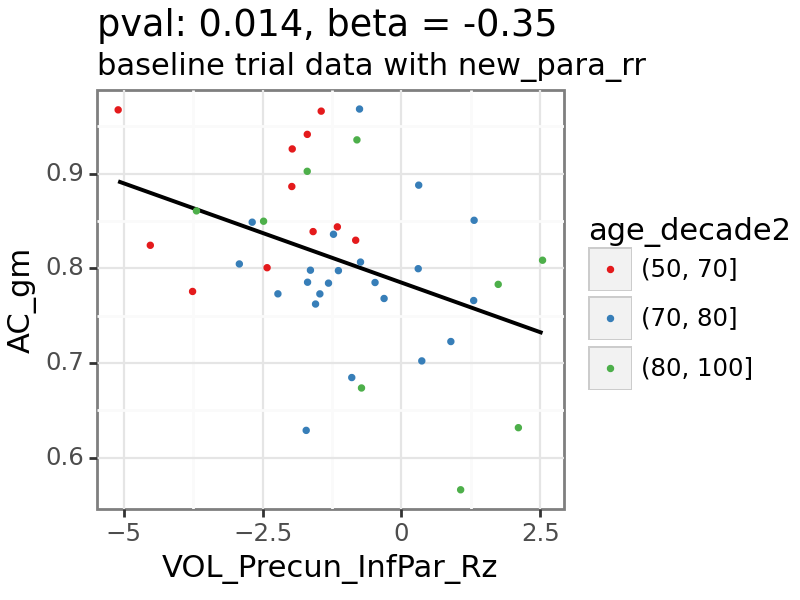

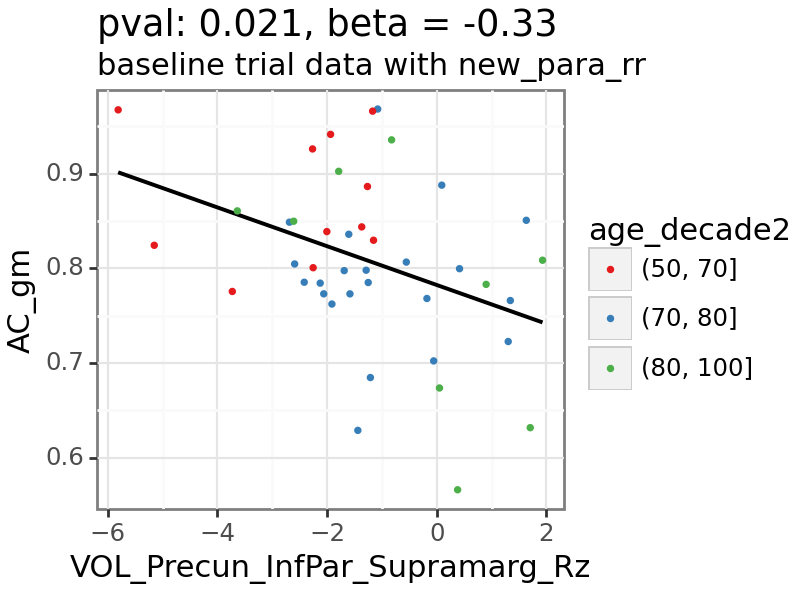

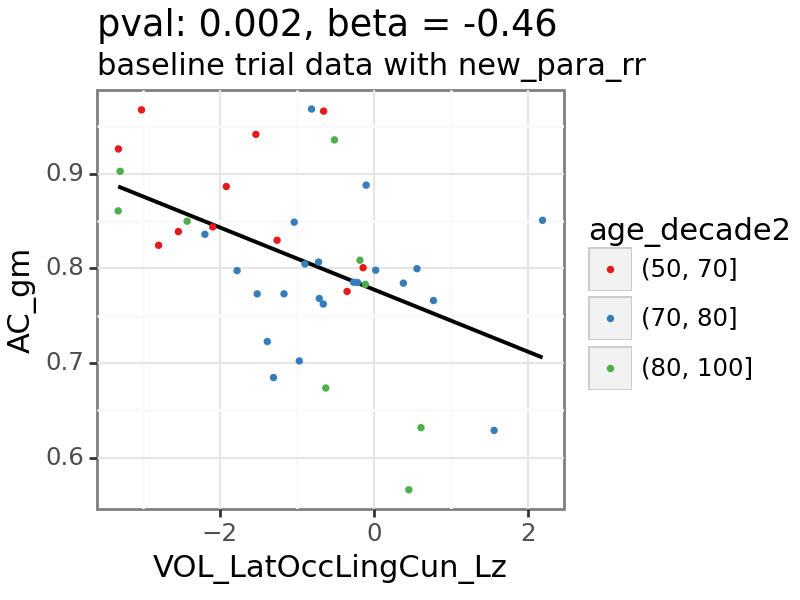

In [62]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True).round(3).replace({0.0:'<0.001'}).astype('str')[0]
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval: ' + p_value + ', beta = ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Precun_gm


In [63]:
x_var = 'Precun_gm'

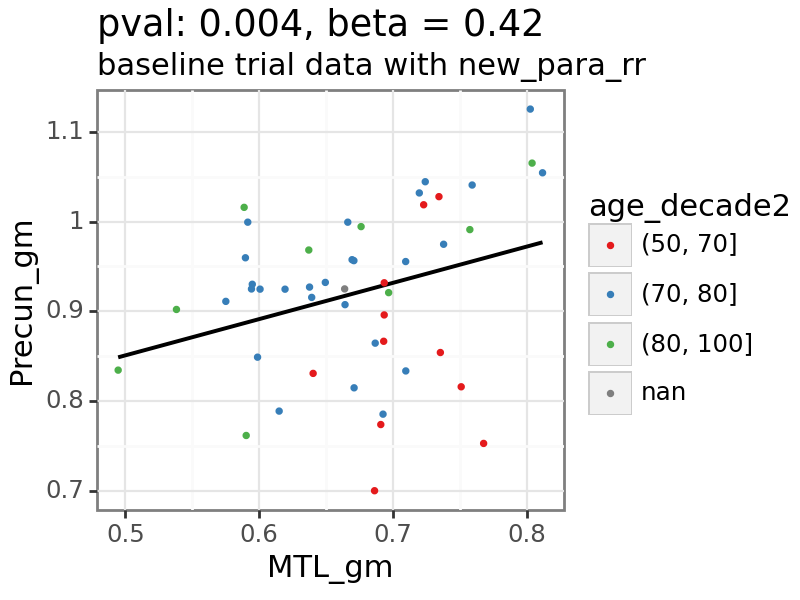

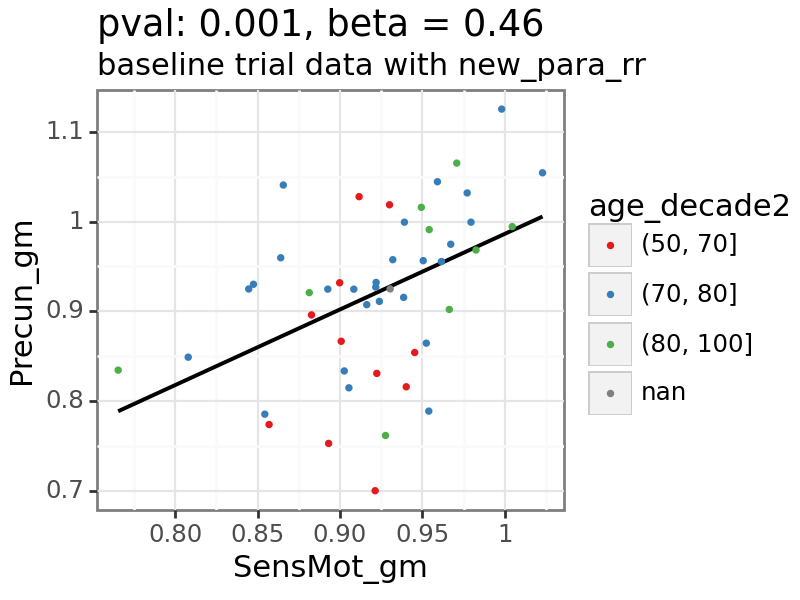

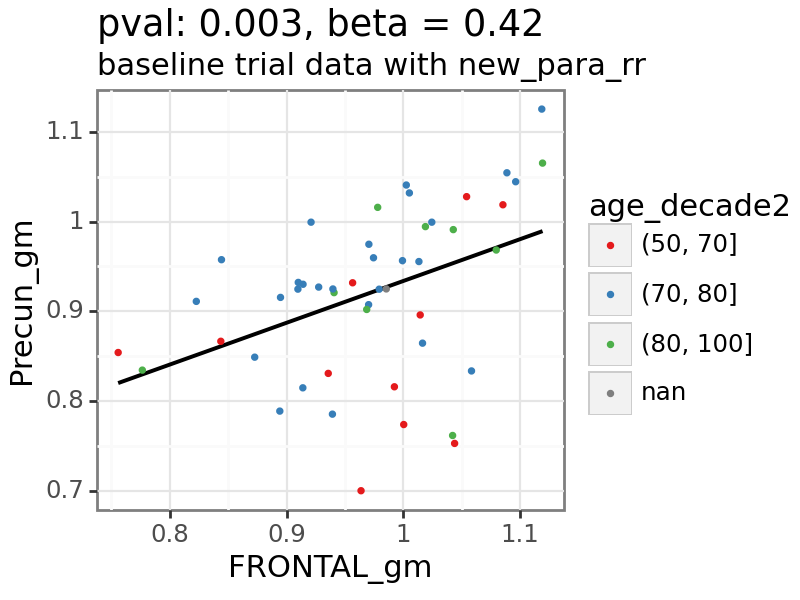

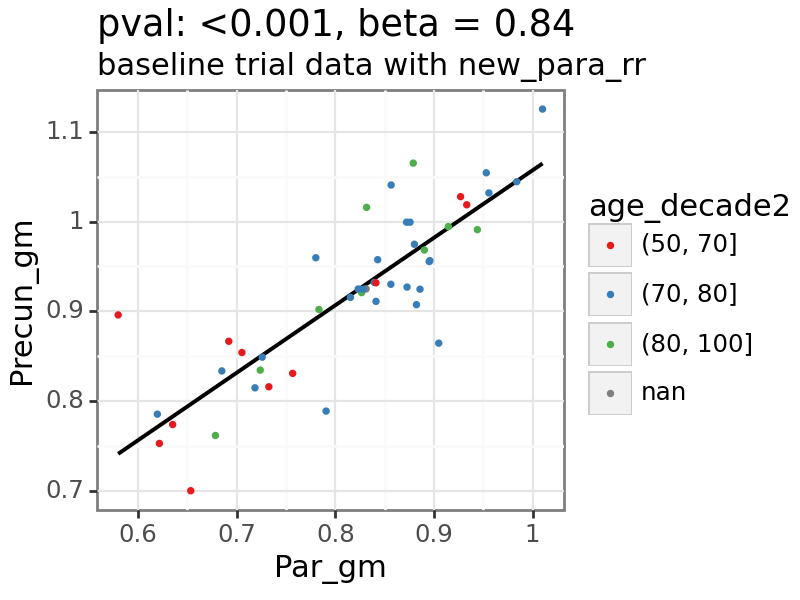

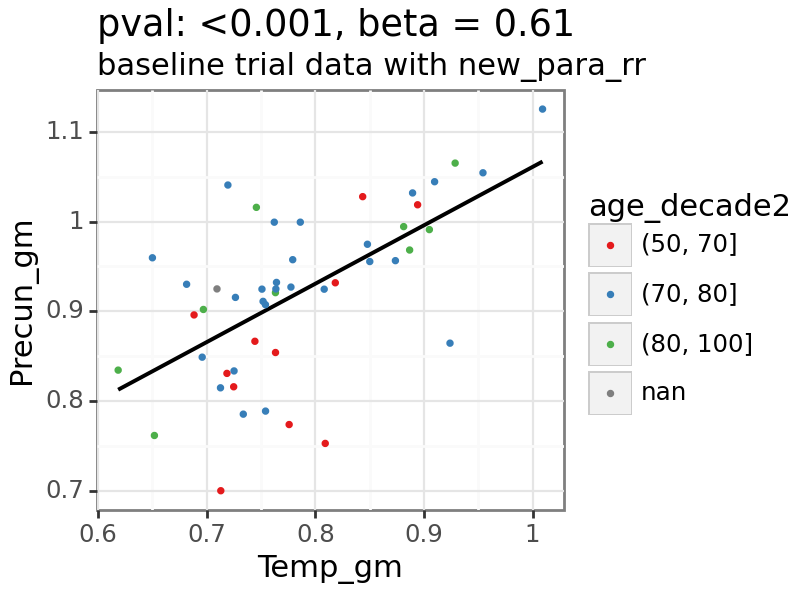

...

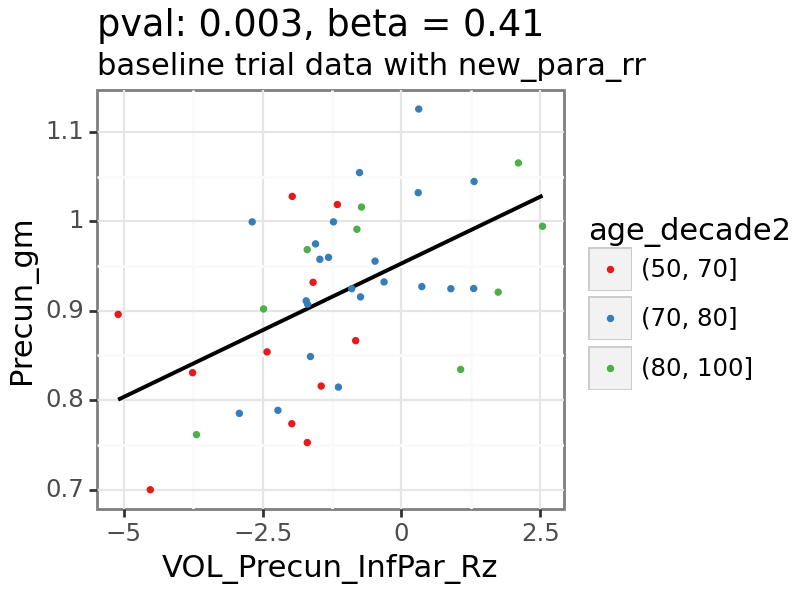

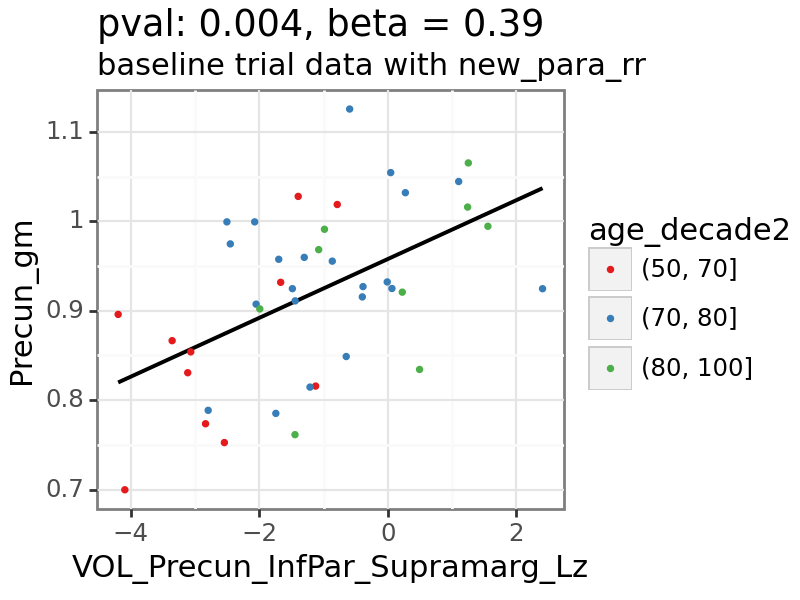

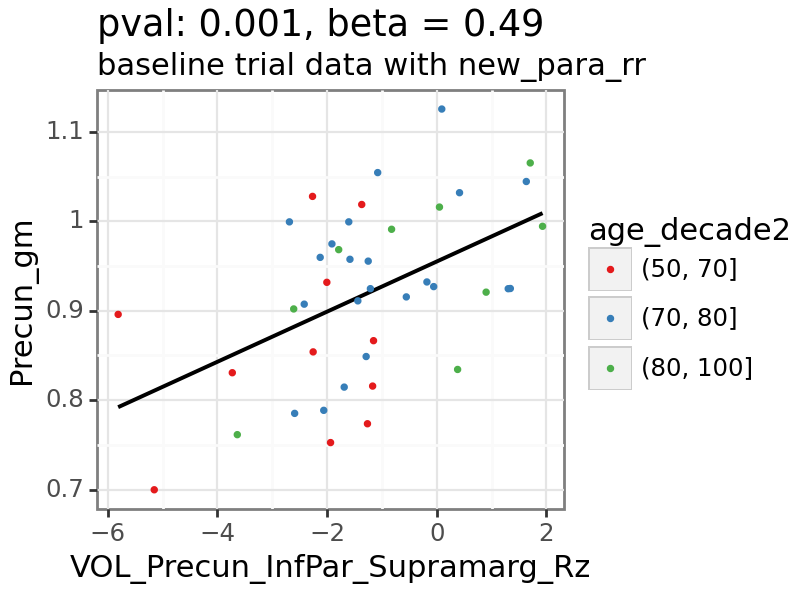

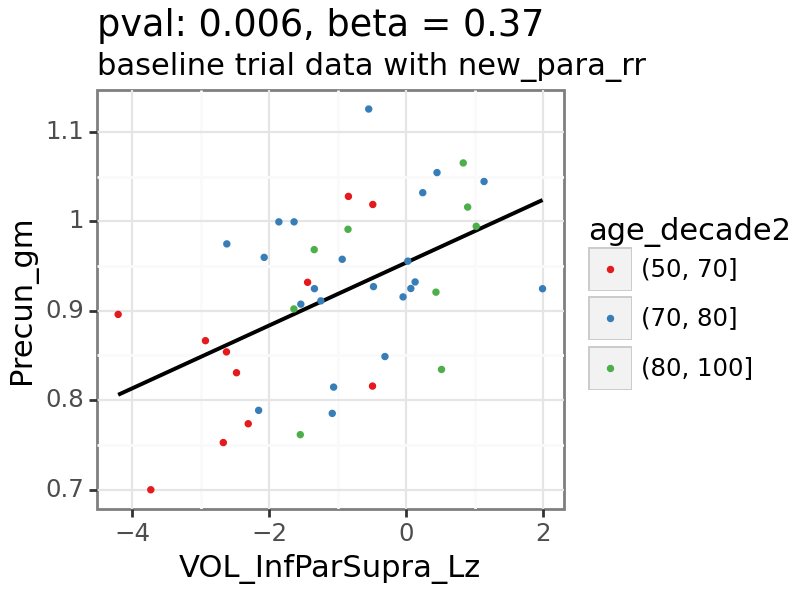

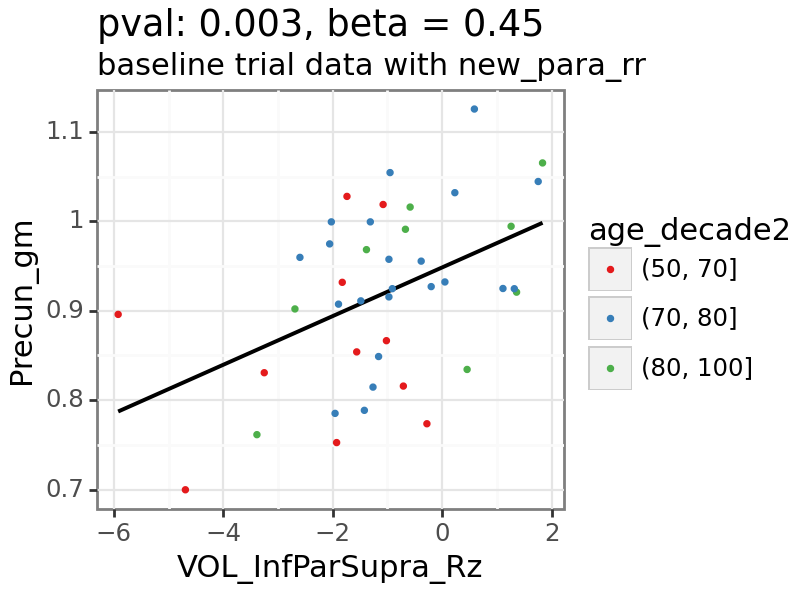

In [64]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True).round(3).replace({0.0:'<0.001'}).astype('str')[0]
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval: ' + p_value + ', beta = ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Par_gm

In [65]:
x_var = 'Par_gm'

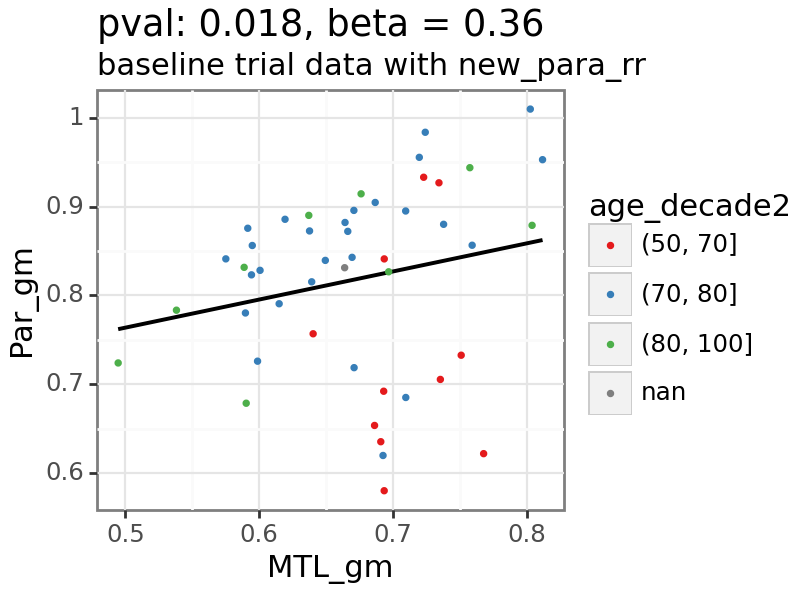

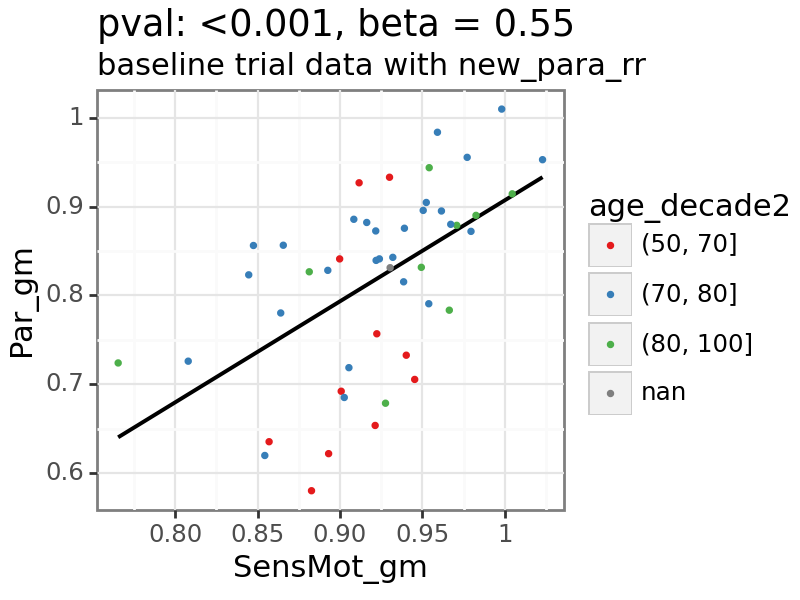

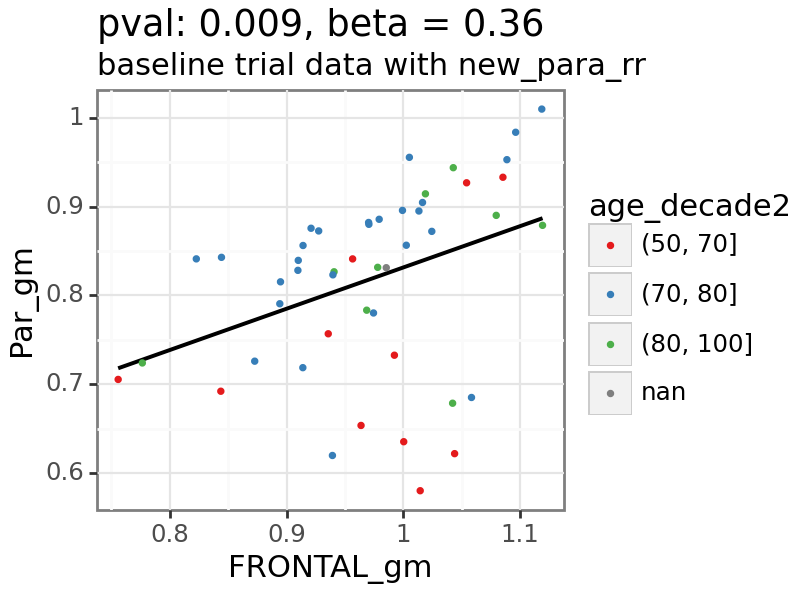

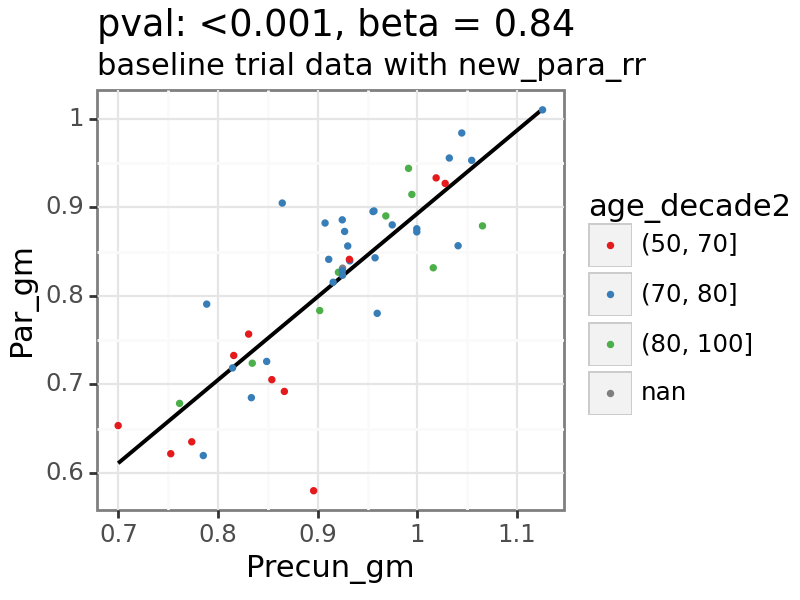

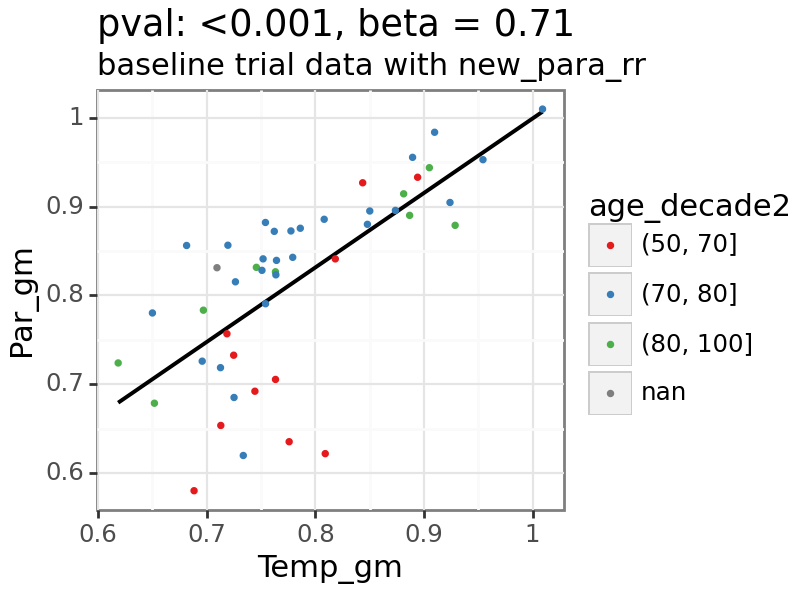

...

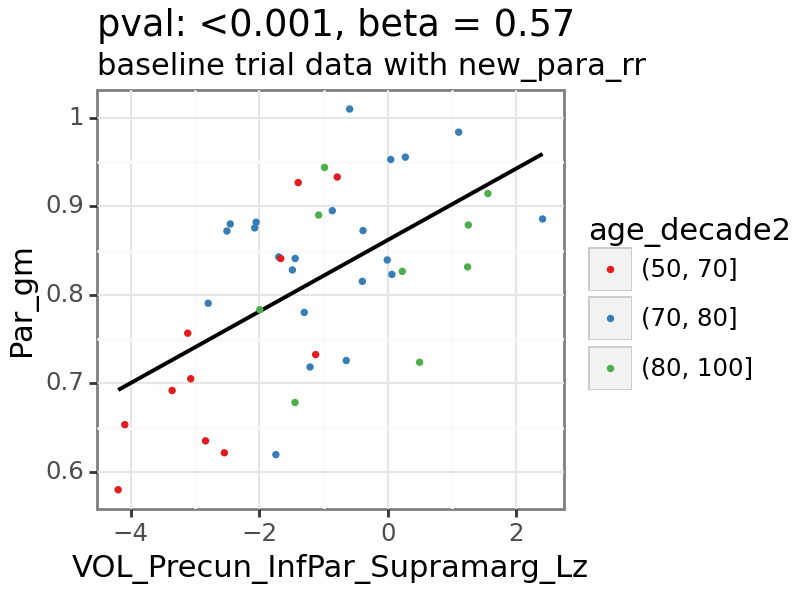

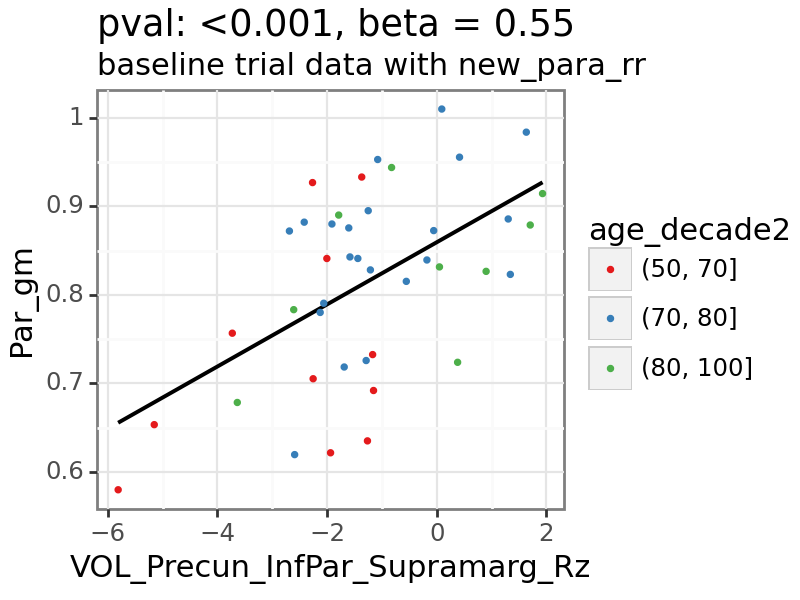

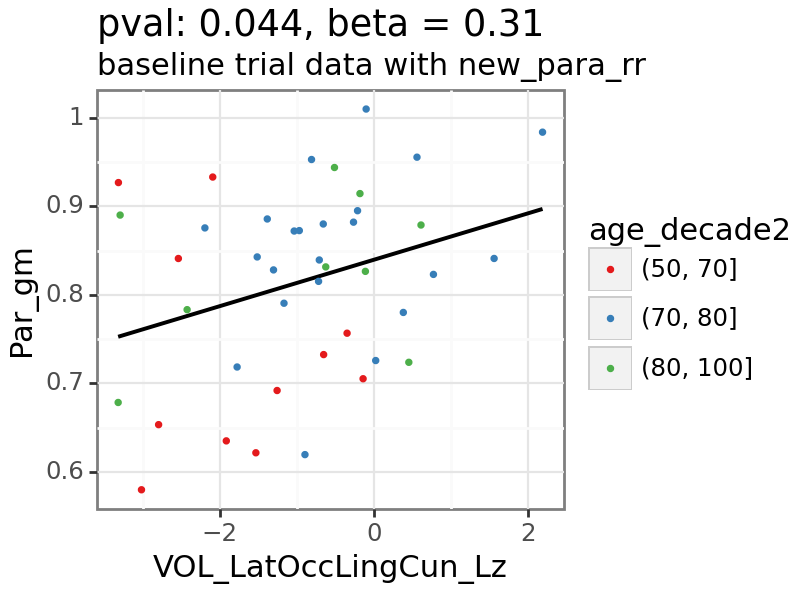

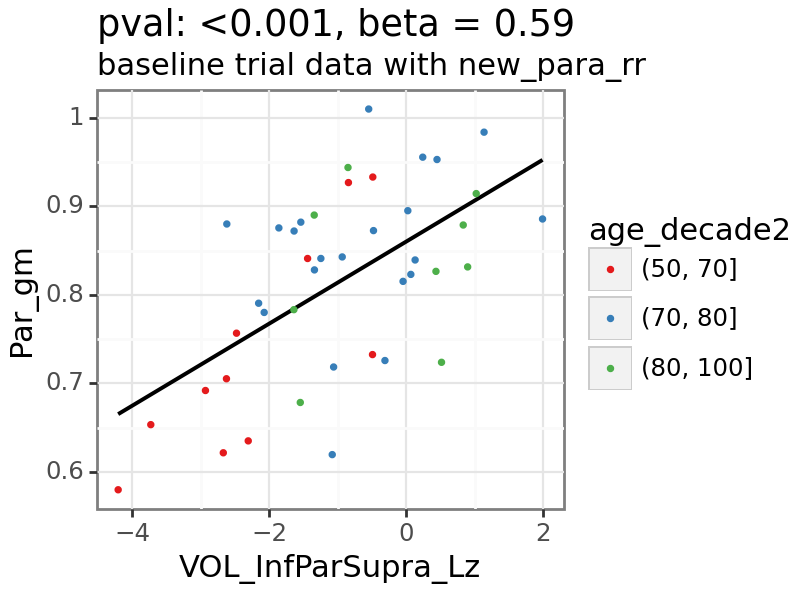

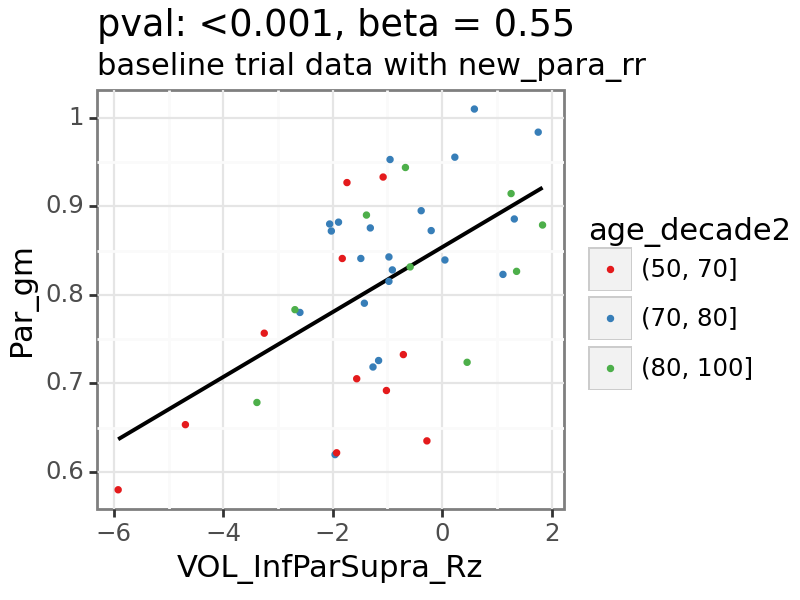

In [66]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']
    
for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True).round(3).replace({0.0:'<0.001'}).astype('str')[0]
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval: ' + p_value + ', beta = ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Temp_gm

In [67]:
x_var = 'Temp_gm'

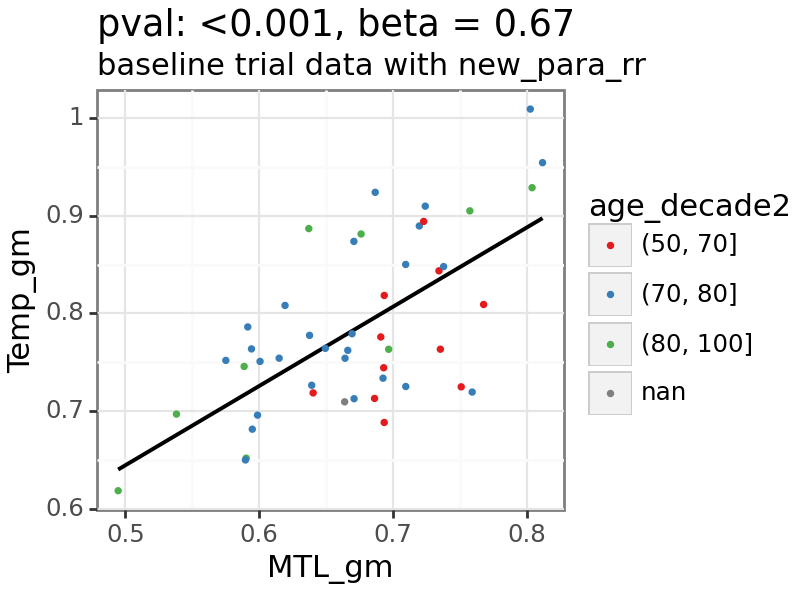

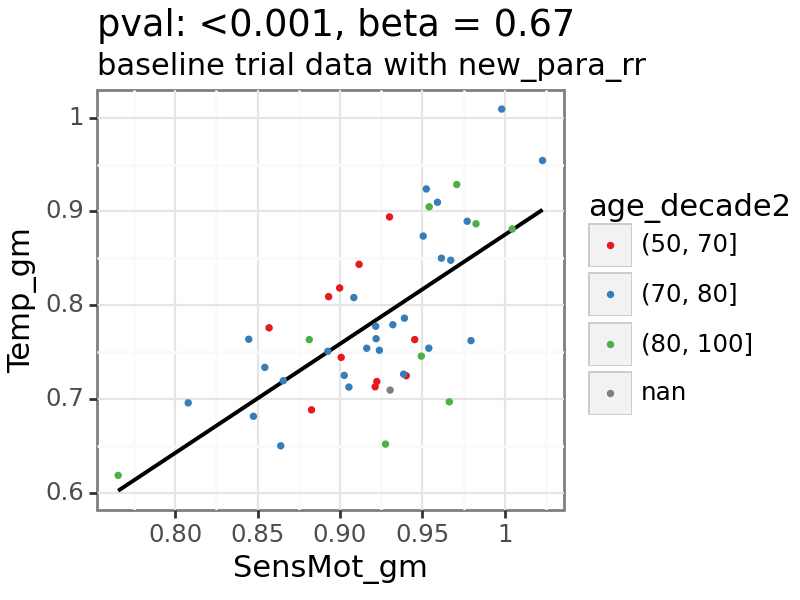

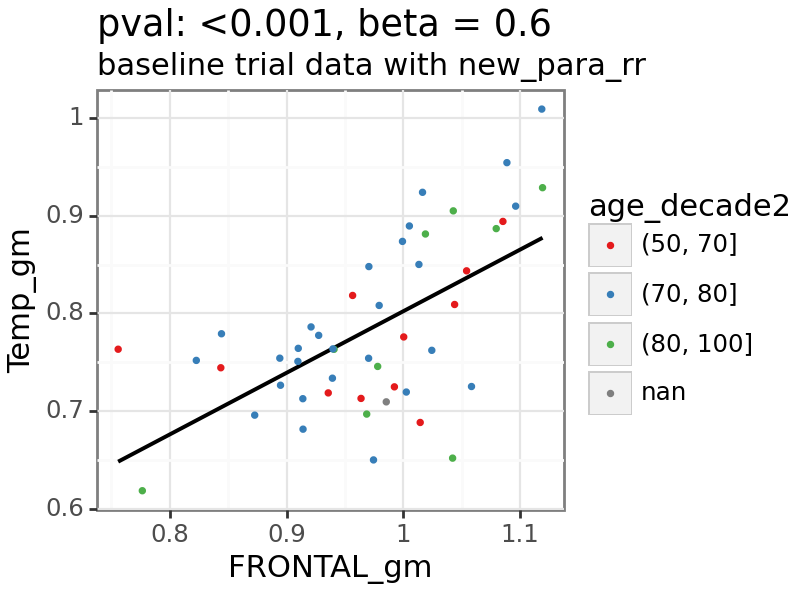

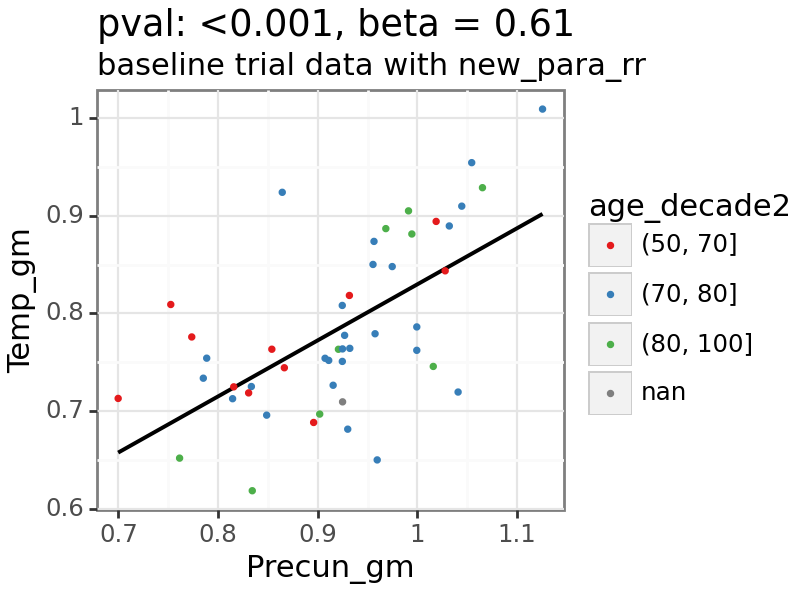

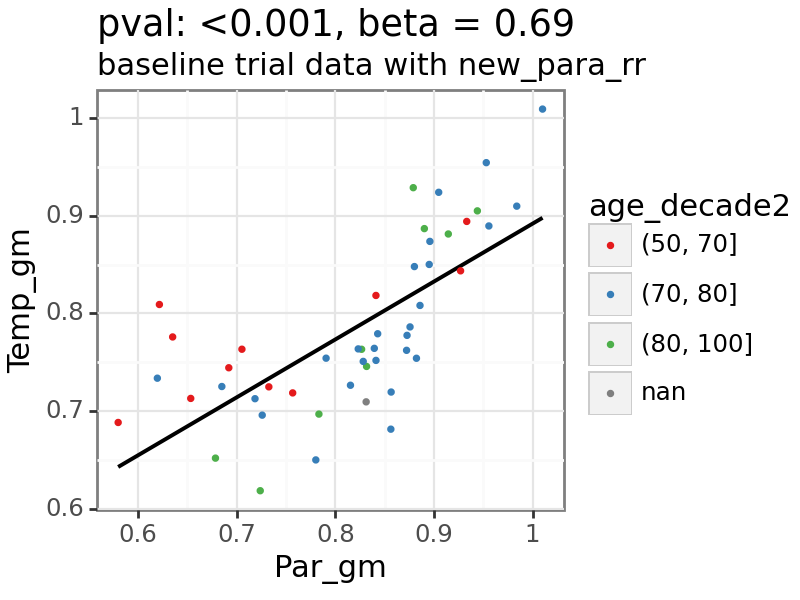

...

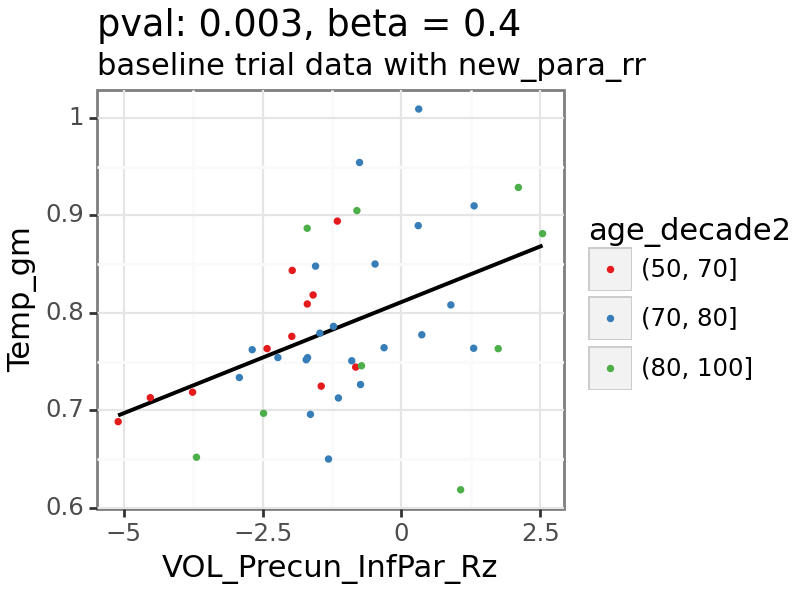

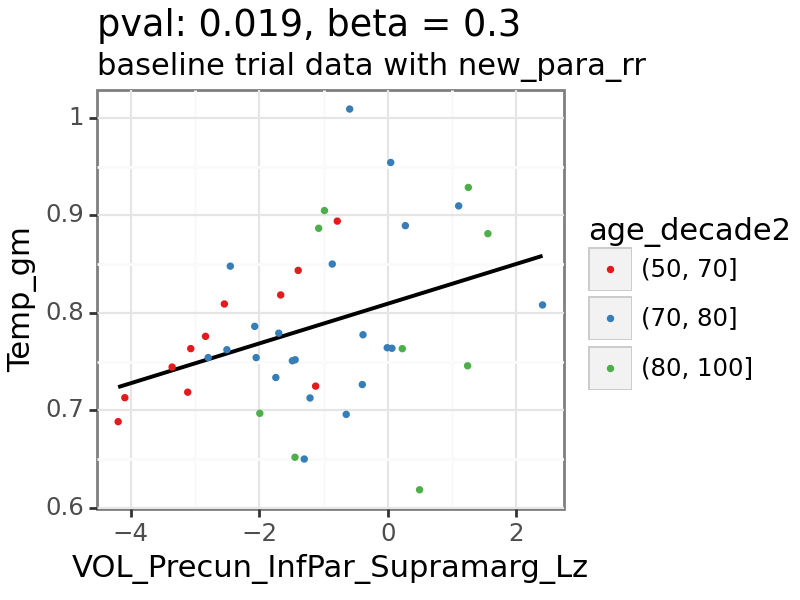

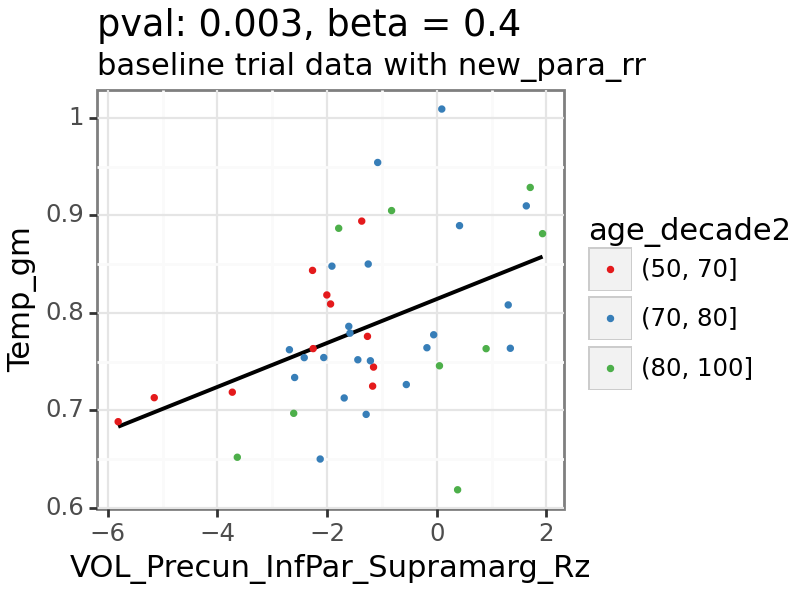

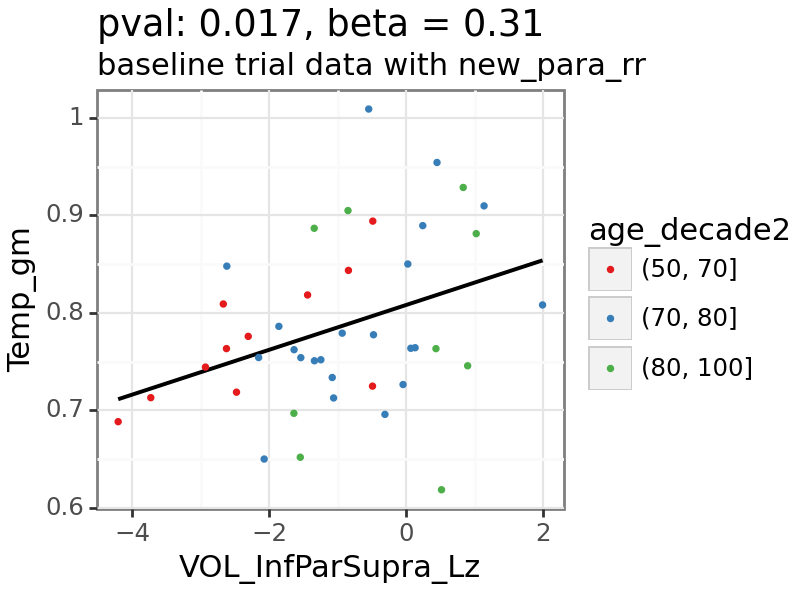

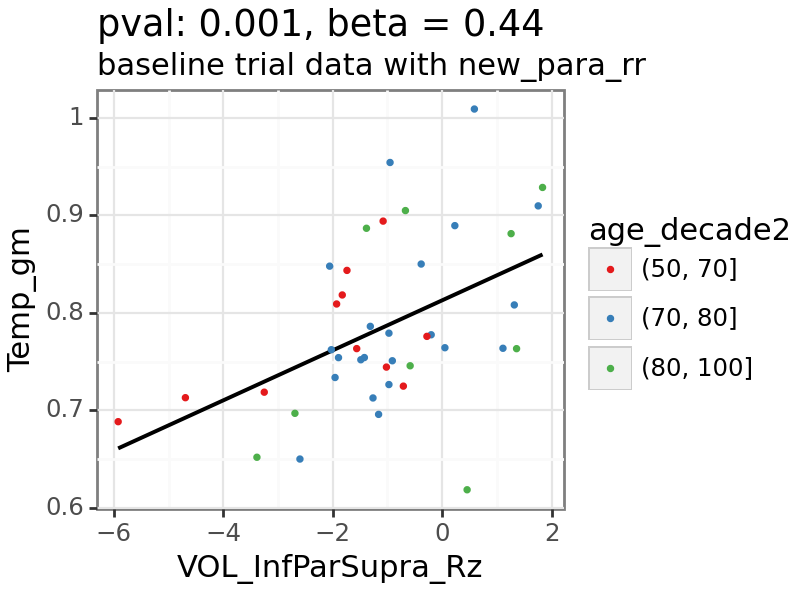

In [68]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True).round(3).replace({0.0:'<0.001'}).astype('str')[0]
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval: ' + p_value + ', beta = ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## PostCing_gm

In [69]:
x_var = 'PostCing_gm'

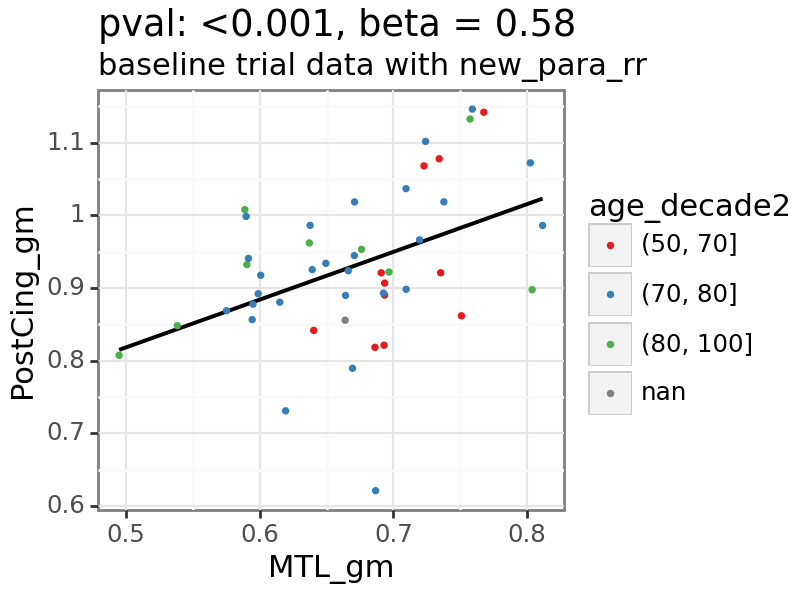

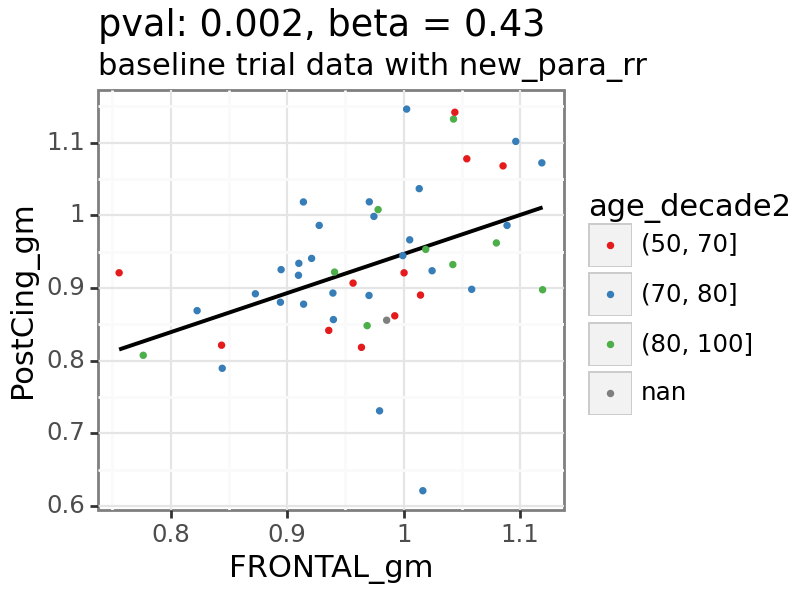

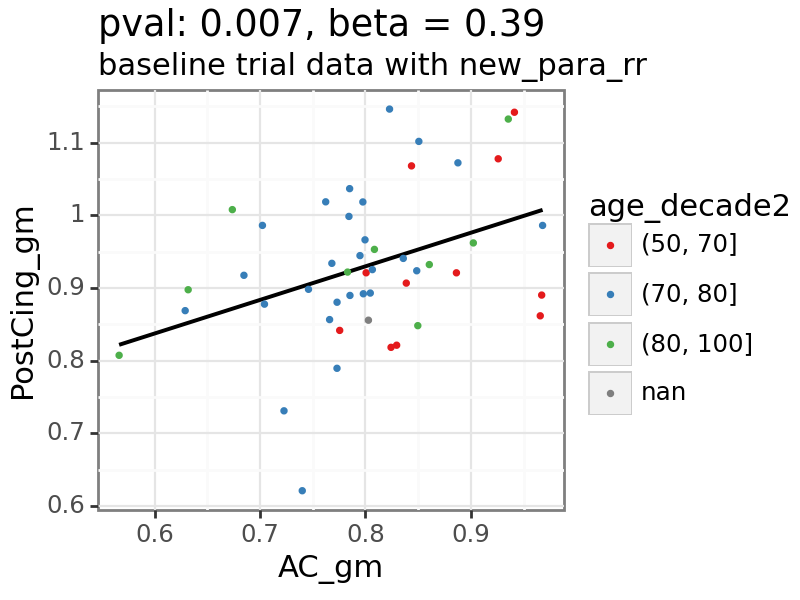

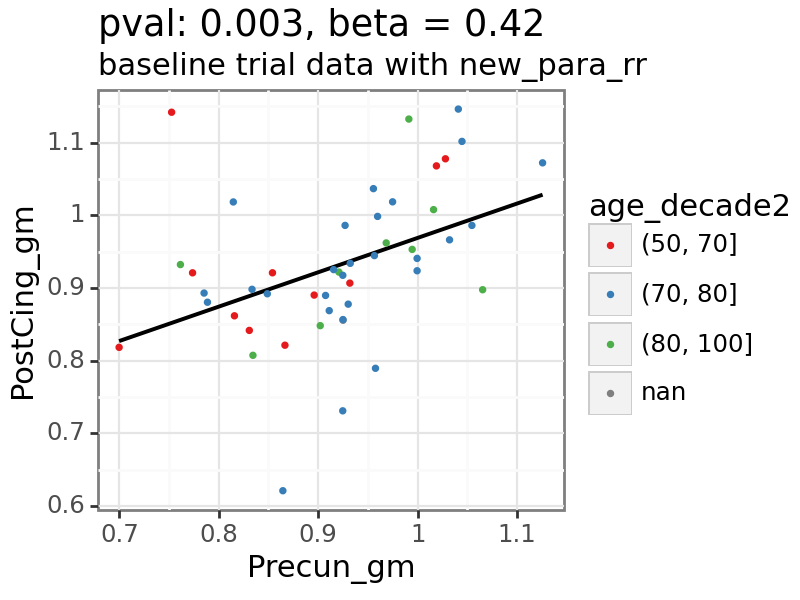

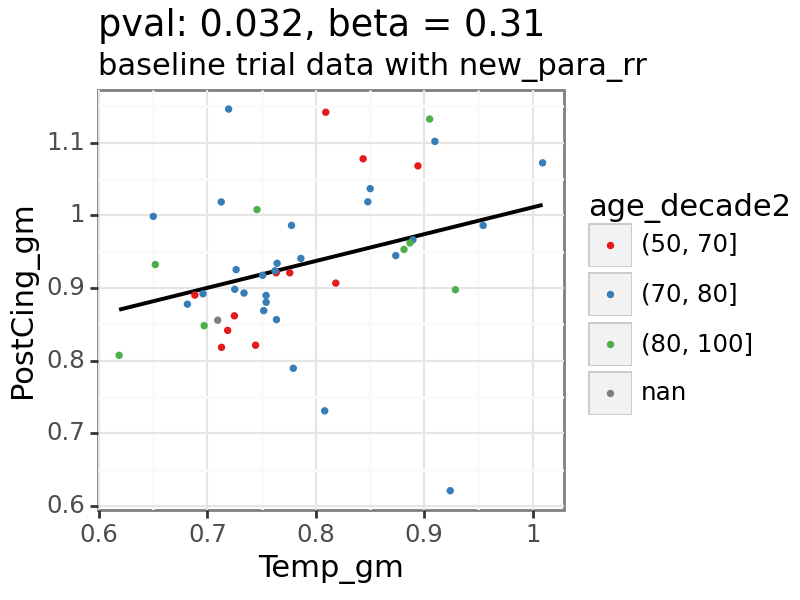

...

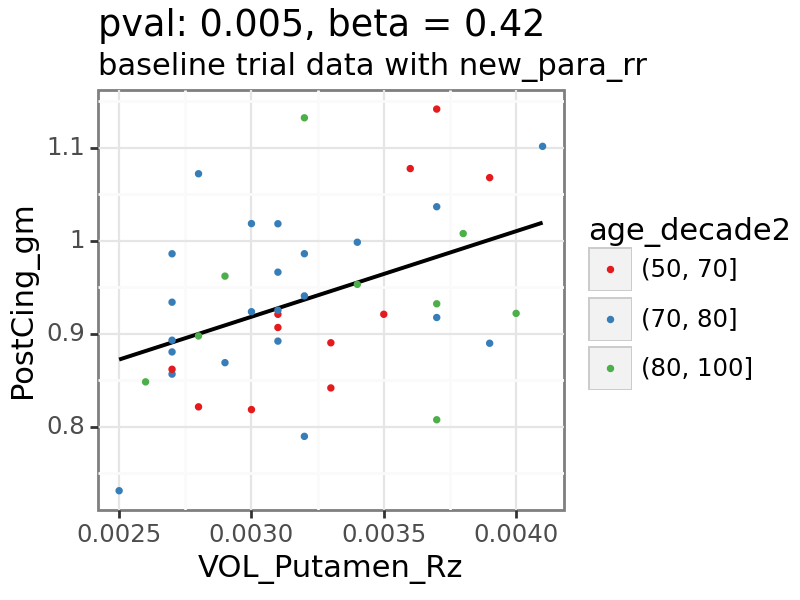

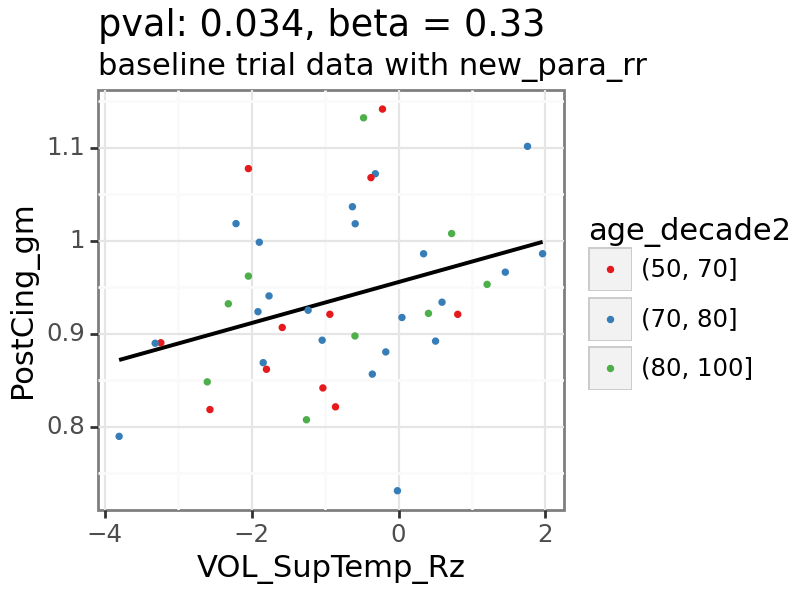

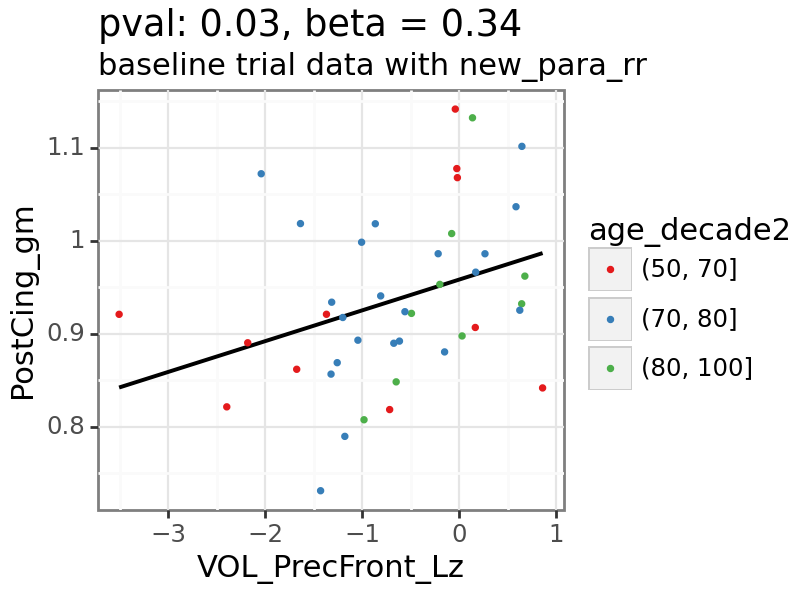

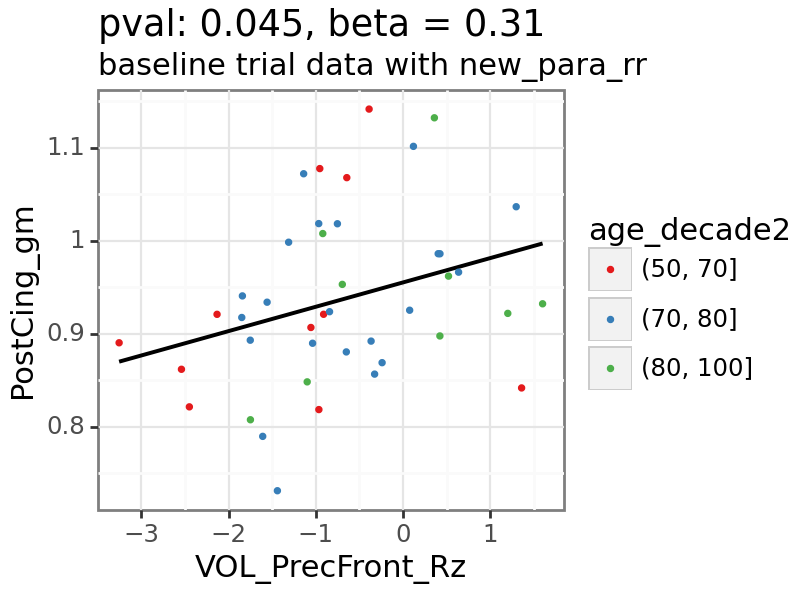

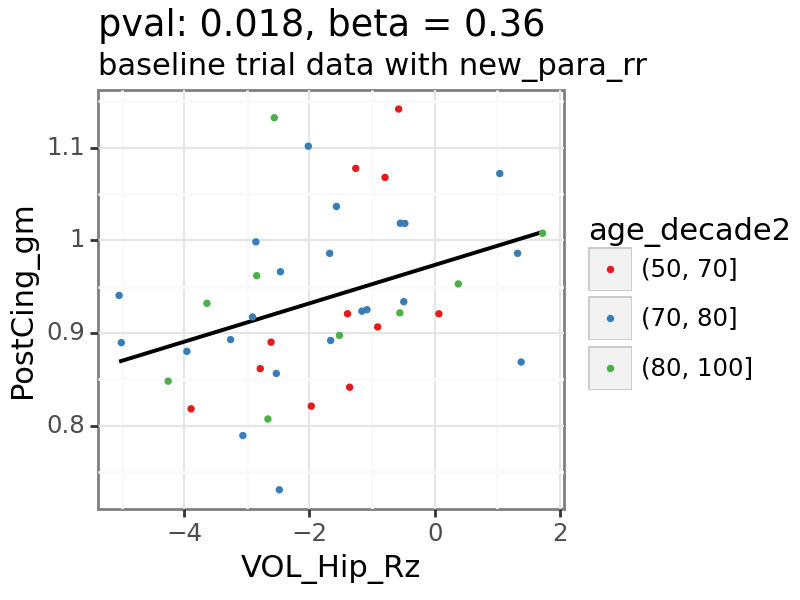

In [70]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['x_var'].isin([x_var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'y_var']

for y_var in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), pvals_to_consider[0]].reset_index(drop=True).round(3).replace({0.0:'<0.001'}).astype('str')[0]
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['y_var'].isin([y_var]) & biomarker_relationship_results_log10['x_var'].isin([x_var]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [y_var, x_var])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = y_var, y = x_var, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval: ' + p_value + ', beta = ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)